In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from pathlib import Path

script_dir = Path.cwd() 
df_raw = pd.read_csv(script_dir.parent / '4 - Dataset' / "weld_data_raw.csv")

# Afficher les premières lignes du dataframe

print(df_raw.head())


   Carbon concentration (weight%)  Silicon concentration (weight%)  \
0                           0.037                             0.30   
1                           0.037                             0.30   
2                           0.037                             0.30   
3                           0.037                             0.31   
4                           0.037                             0.31   

   Manganese concentration (weight%) Sulphur concentration (weight%)  \
0                               0.65                           0.008   
1                               0.65                           0.008   
2                               0.65                           0.008   
3                               1.03                           0.007   
4                               1.03                           0.007   

  Phosphorus concentration (weight%) Nickel concentration (weight%)  \
0                              0.012                            0.0   
1   

In [44]:
import pandas as pd
import numpy as np
import re

# Chargement des données
df_raw = pd.read_csv(script_dir.parent / '4 - Dataset' / "weld_data_raw.csv")

# Copie de la DataFrame originale
df_weld_data = df_raw.copy()

# Définition du mapping pour le type de soudure
weld_type_mapping = {
    "MMA": 0,
    "SA": 1,
    "FCA": 2,
    "TSA": 3,
    "ShMA": 4,
    "NGSAW": 5,
    "NGGMA": 6,
    "GMAA": 7,
    "GTAA": 8,
    "SAA": 9
}

# Transformation des colonnes
def transform_data(df):
    df.replace('N', np.nan, inplace=True) #remplacr le N par nan

    # Calculer le point médian pour la température d'interpass
    def calculate_interpass_temp(temp):
        if isinstance(temp, str) and '-' in temp:
            lower_bound, upper_bound = map(float, temp.split('-'))
            return (lower_bound + upper_bound) / 2
        return temp

    df['Interpass temperature (deg C)'] = df['Interpass temperature (deg C)'].apply(calculate_interpass_temp)

    # Traiter les concentrations préfixées par '<'
    concentration_indices = [3, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 20, 38]
    for index in concentration_indices:
        df.iloc[:, index] = df.iloc[:, index].apply(lambda x: float(x[1:]) if isinstance(x, str) and x.startswith('<') else x)

    # Transformer la concentration d'azote (ppm)
    df['Nitrogen concentration (ppm)'] = df['Nitrogen concentration (ppm)'].apply(lambda x: float(re.match(r'(\d+)', x).group(1)) if isinstance(x, str) and re.match(r'(\d+)', x) else -1)

    # Remplacer les types de soudure
    df['Type of weld'] = df['Type of weld'].map(weld_type_mapping).fillna(-1)

    # Transformer la dureté (kg/mm²)
    df['Hardness (kg/mm2)'] = df['Hardness (kg/mm2)'].apply(lambda x: float(re.match(r'(\d+)', x).group(1)) if isinstance(x, str) and re.match(r'(\d+)', x) else -1)

    # Gérer la colonne "Electrode positive ou négative"
    df['Electrode positive or negative'] = df['Electrode positive or negative'].map({'+': 1, '-': 2}).fillna(0)

    # Gérer la colonne "AC ou DC"
    df['AC or DC'] = df['AC or DC'].map({'AC': 1, 'DC': 0})

    return df

# Appliquer la transformation à la DataFrame
df_weld_data = transform_data(df_weld_data)

# Afficher le DataFrame nettoyé
print("DataFrame nettoyé :")
print(df_weld_data.head())

# Optionnel : Écrire le DataFrame dans un fichier CSV

df_weld_data.to_csv('weld_data.csv', index=False)
print("Les données ont été écrites dans 'weld_data.csv' avec succès.")


DataFrame nettoyé :
   Carbon concentration (weight%)  Silicon concentration (weight%)  \
0                           0.037                             0.30   
1                           0.037                             0.30   
2                           0.037                             0.30   
3                           0.037                             0.31   
4                           0.037                             0.31   

   Manganese concentration (weight%) Sulphur concentration (weight%)  \
0                               0.65                           0.008   
1                               0.65                           0.008   
2                               0.65                           0.008   
3                               1.03                           0.007   
4                               1.03                           0.007   

  Phosphorus concentration (weight%) Nickel concentration (weight%)  \
0                              0.012                   

In [45]:
import pandas as pd

# Chargement des données depuis le fichier weld_data_raw.csv
df = pd.read_csv("weld_data.csv")

# Liste des colonnes contenant des valeurs en weight % à convertir en ppm
weight_percent_columns = [
    "Carbon concentration (weight%)", "Silicon concentration (weight%)", 
    "Manganese concentration (weight%)", "Sulphur concentration (weight%)", 
    "Phosphorus concentration (weight%)", "Nickel concentration (weight%)", 
    "Chromium concentration (weight%)", "Molybdenum concentration (weight%)", 
    "Vanadium concentration (weight%)", "Copper concentration (weight%)", 
    "Cobalt concentration (weight%)", "Tungsten concentration (weight%)"
]

# Multiplier les valeurs en weight % par 10,000 pour obtenir des ppm
for column in weight_percent_columns:
    if column in df.columns:
        df[column] = df[column].apply(lambda x: x * 10000 if pd.notnull(x) else x)

# Sauvegarder les données converties dans un nouveau fichier CSV
df.to_csv('weld_data_converted.csv', index=False)

print("Les colonnes en weight % ont été converties en ppm et les données ont été sauvegardées dans 'weld_data_converted.csv'.")


Les colonnes en weight % ont été converties en ppm et les données ont été sauvegardées dans 'weld_data_converted.csv'.


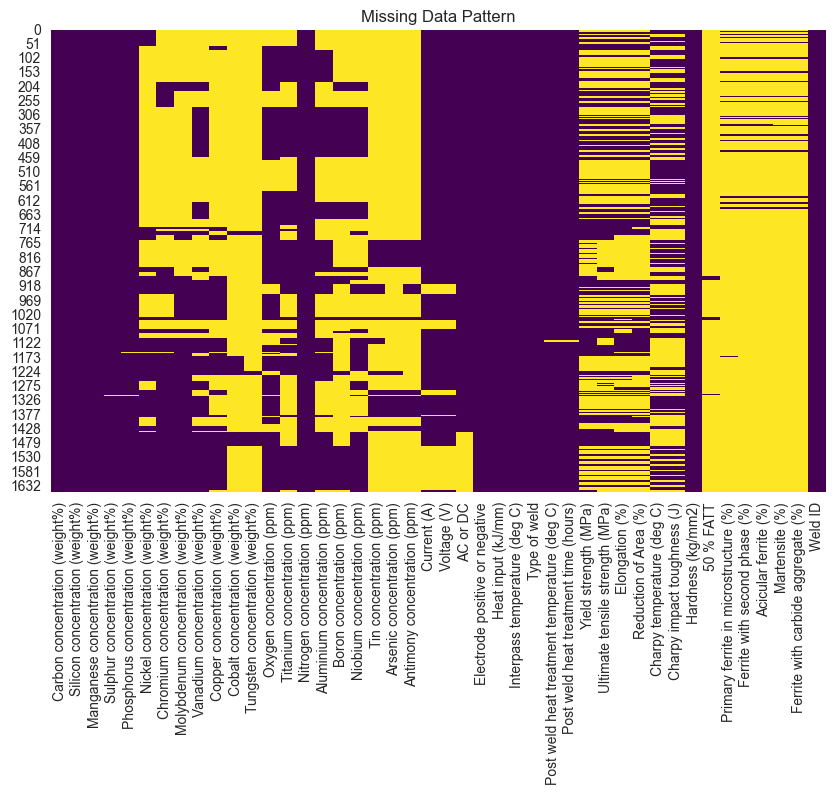

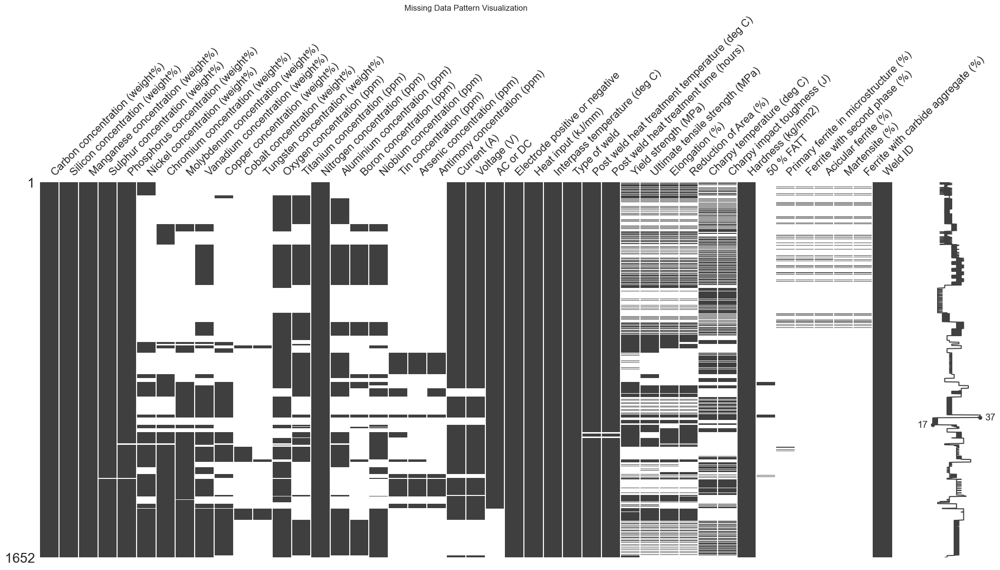

In [46]:
# Visualize missing data patterns
import seaborn as sns
import matplotlib.pyplot as plt

df = pd.read_csv("weld_data.csv")
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Data Pattern")
plt.show()


import missingno as msno
import matplotlib.pyplot as plt

# Visualize the missing data pattern
msno.matrix(df)
plt.title("Missing Data Pattern Visualization")
plt.show()



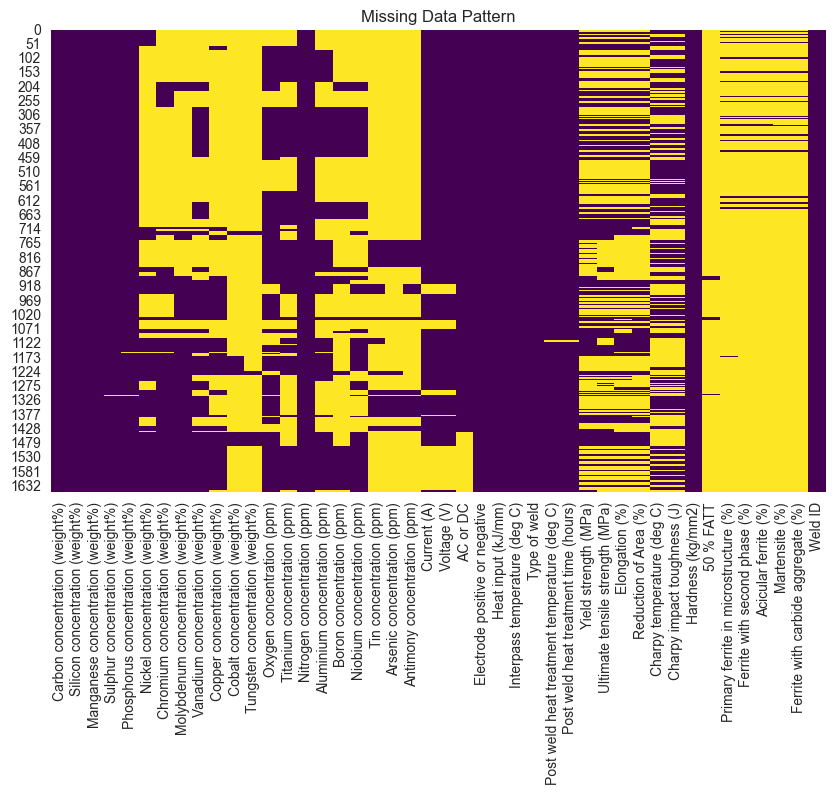

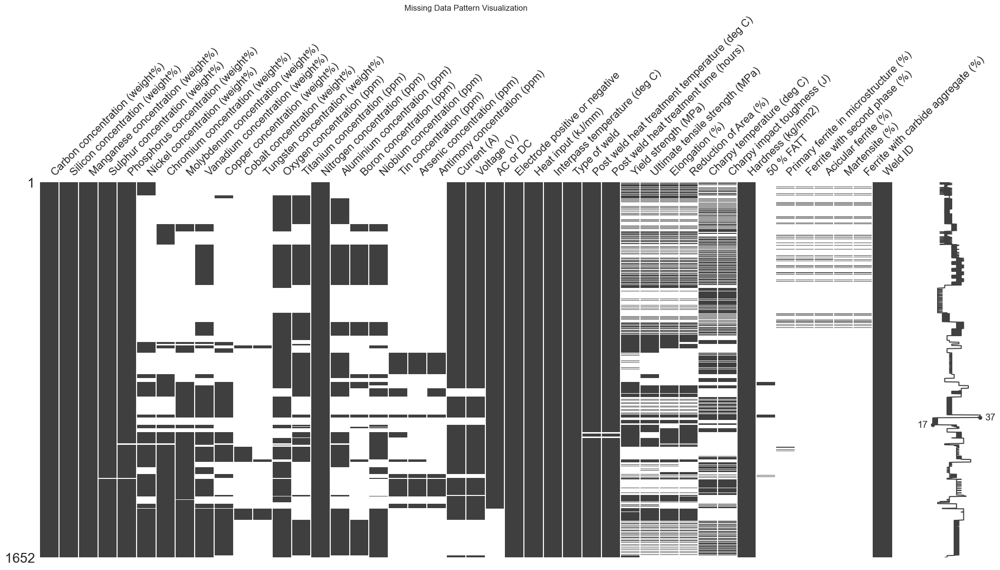

In [47]:
f = pd.read_csv("weld_data_converted.csv")
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Data Pattern")
plt.show()


import missingno as msno
import matplotlib.pyplot as plt

# Visualize the missing data pattern
msno.matrix(df)
plt.title("Missing Data Pattern Visualization")
plt.show()

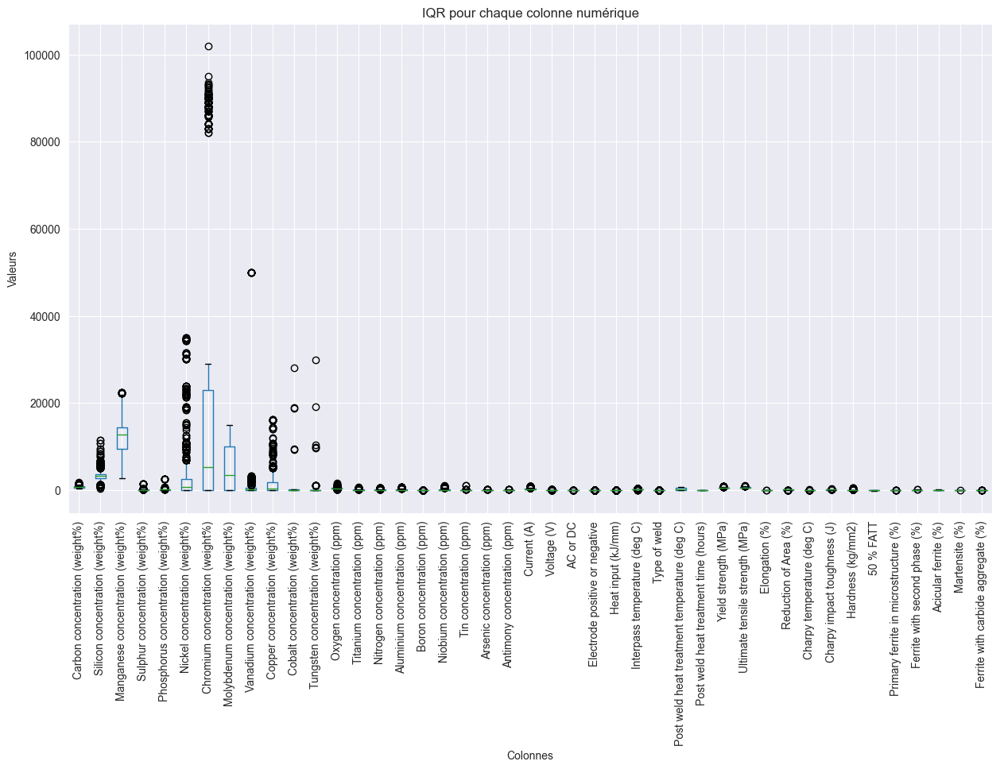

In [48]:
import pandas as pd
import matplotlib.pyplot as plt

# Chargement des données
df = pd.read_csv("weld_data_converted.csv")

# Filtrer les colonnes numériques seulement
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Créer un box plot pour chaque colonne numérique
plt.figure(figsize=(15, 8))  # Ajuster la taille de la figure
df[numeric_columns].boxplot(rot=90)  # Rotation des étiquettes des colonnes pour les rendre lisibles
plt.title("IQR pour chaque colonne numérique")
plt.ylabel("Valeurs")
plt.xlabel("Colonnes")
plt.show()

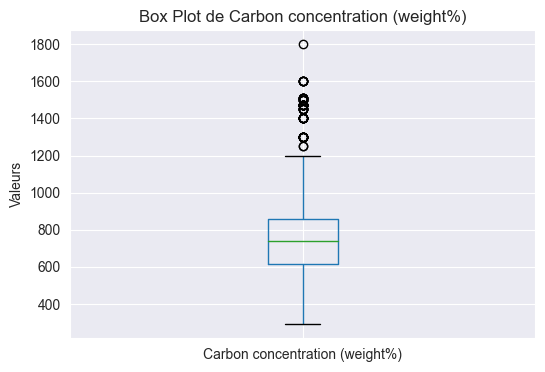

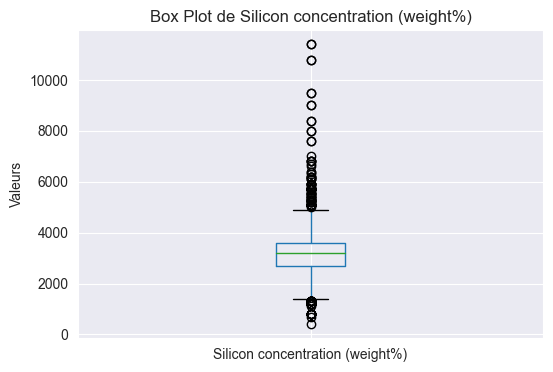

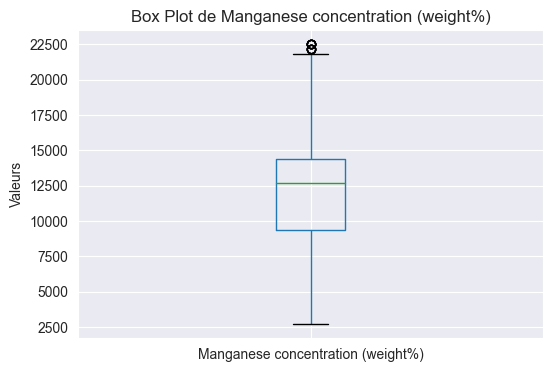

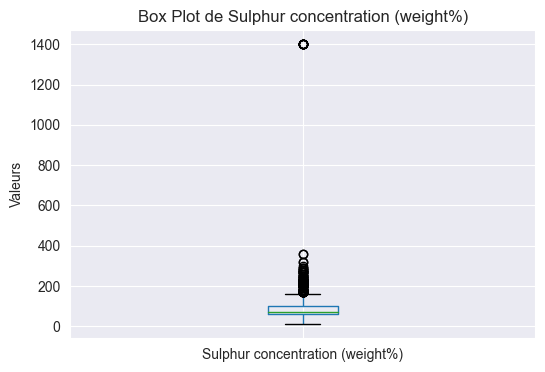

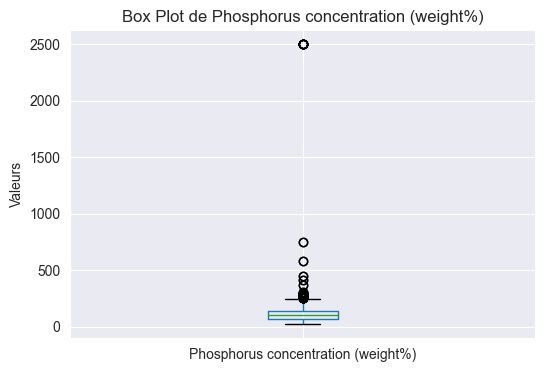

...

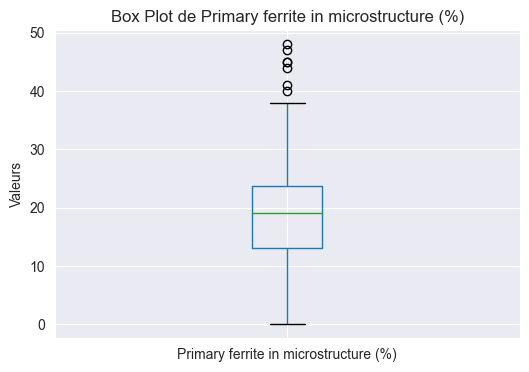

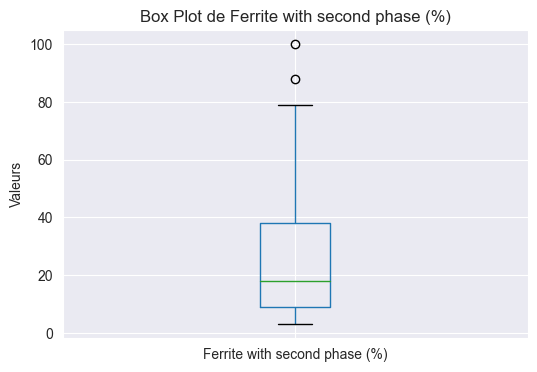

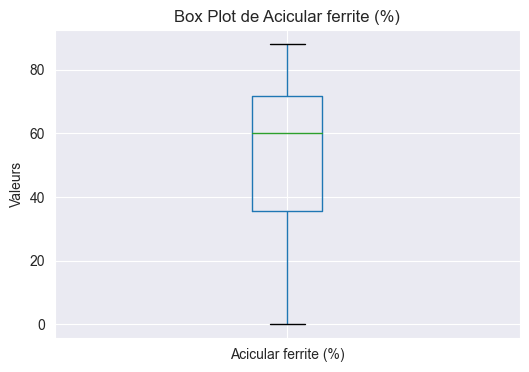

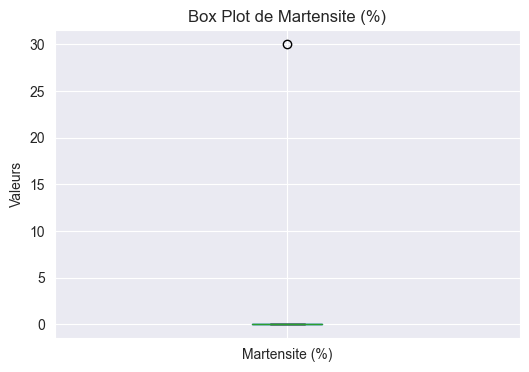

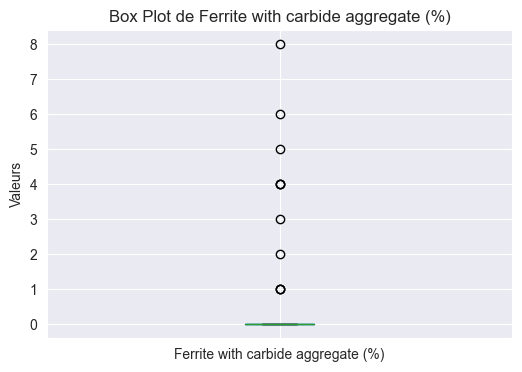

In [49]:
import pandas as pd
import matplotlib.pyplot as plt

# Chargement des données
df = pd.read_csv("weld_data_converted.csv")

# Filtrer les colonnes numériques seulement
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Créer un box plot pour chaque colonne numérique
for column in numeric_columns:
    plt.figure(figsize=(6, 4))  # Taille du graphique
    df.boxplot(column=column)
    plt.title(f"Box Plot de {column}")
    plt.ylabel("Valeurs")
    plt.show()


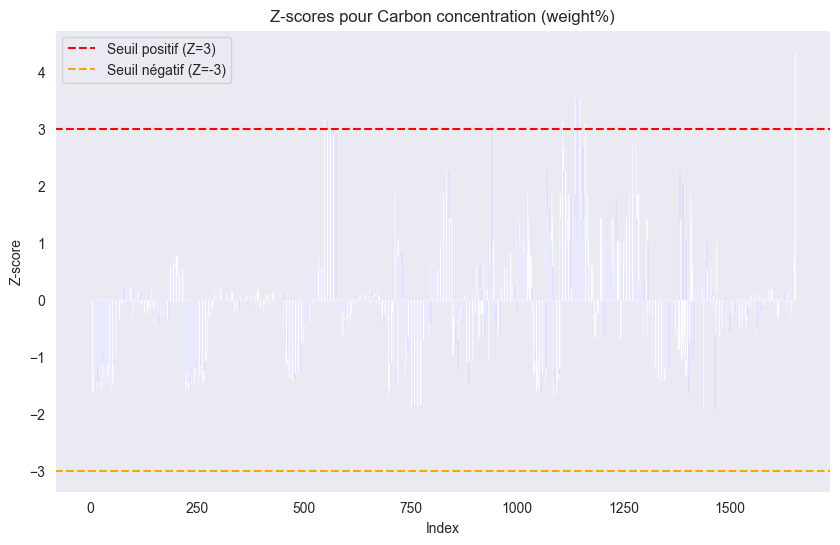

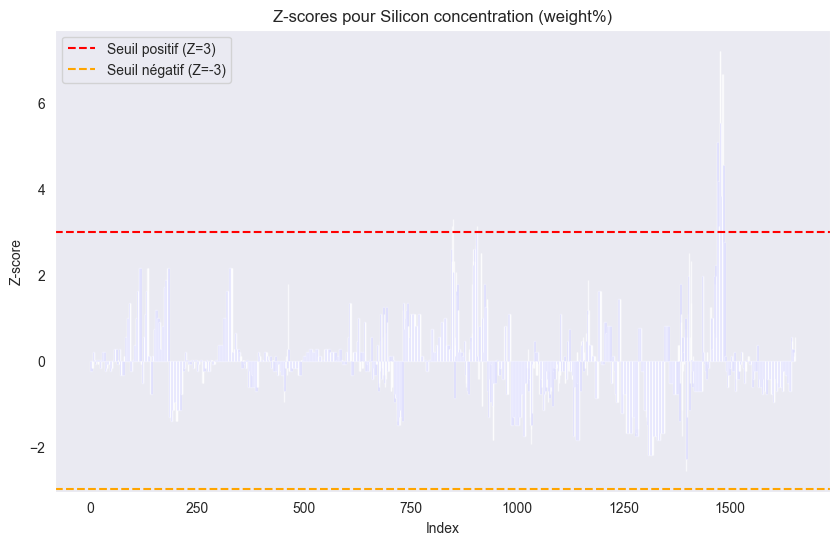

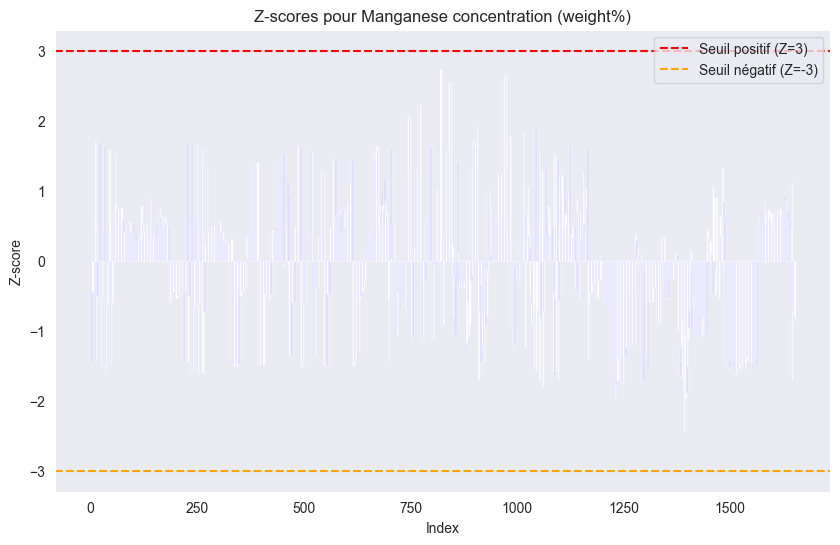

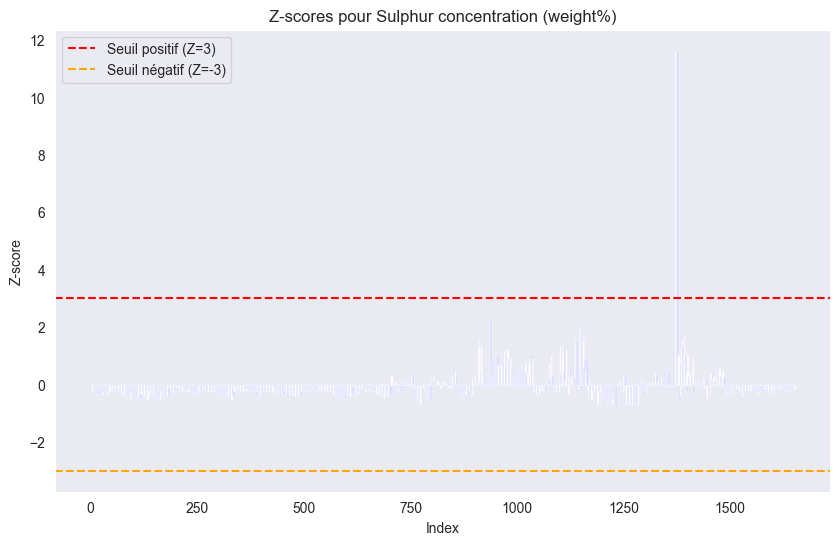

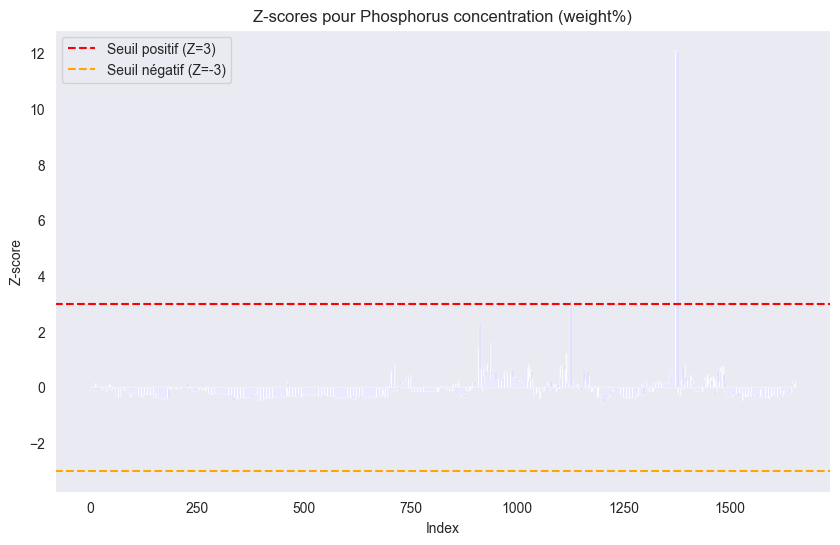

...

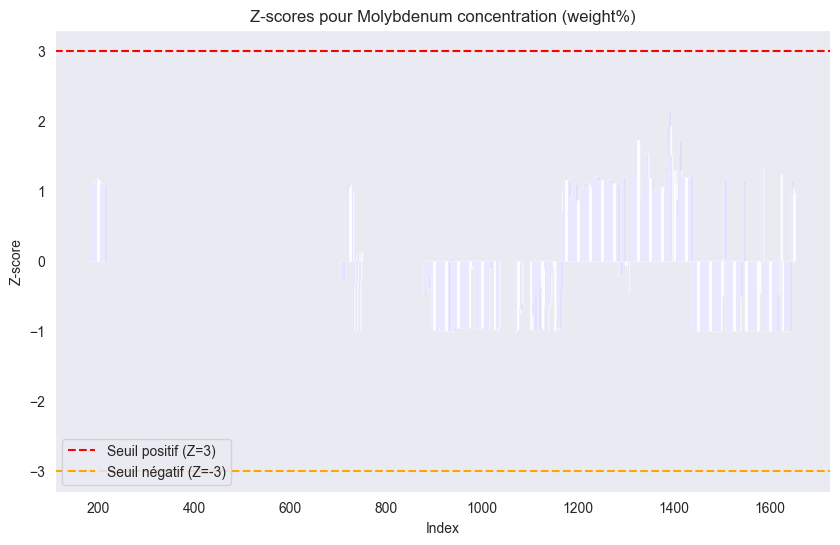

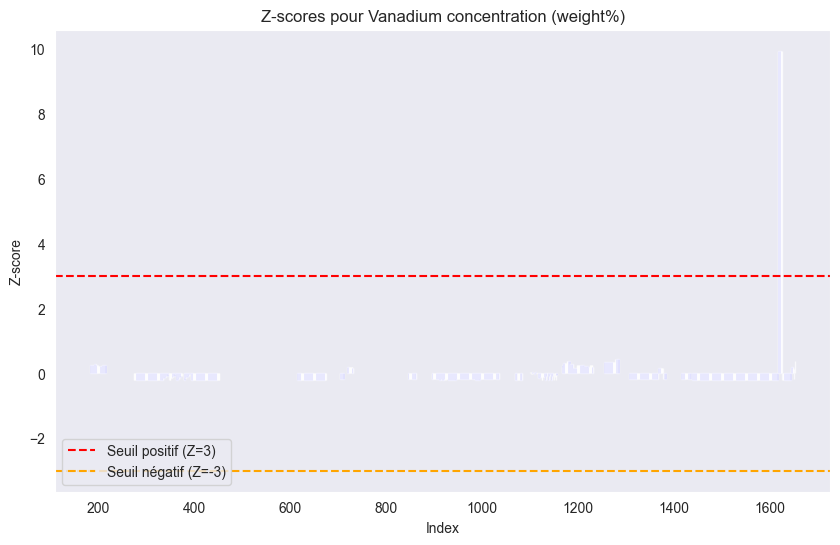

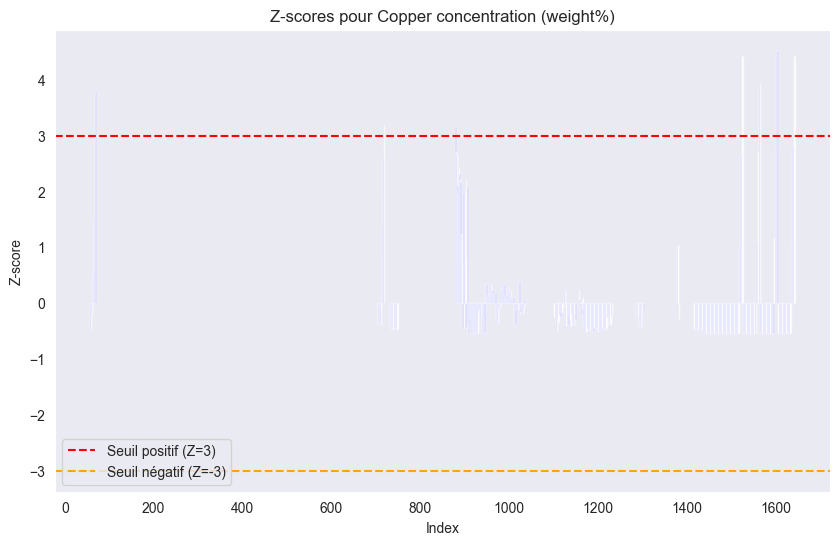

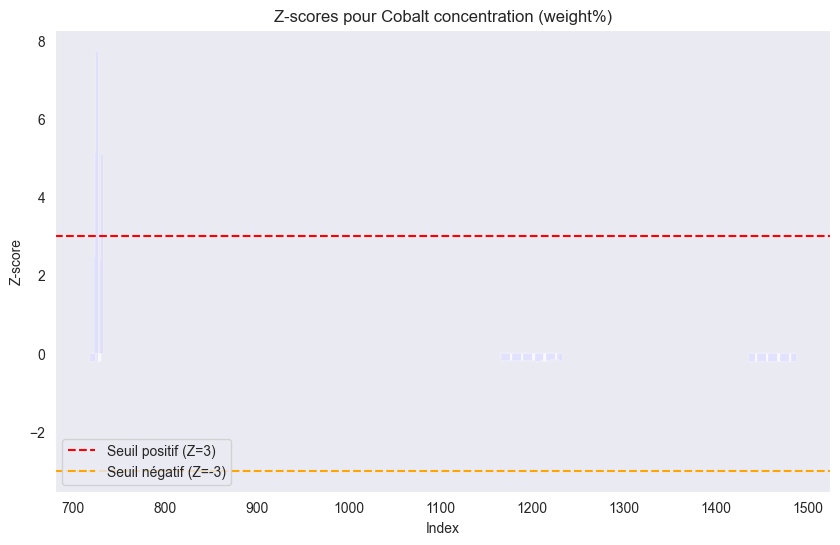

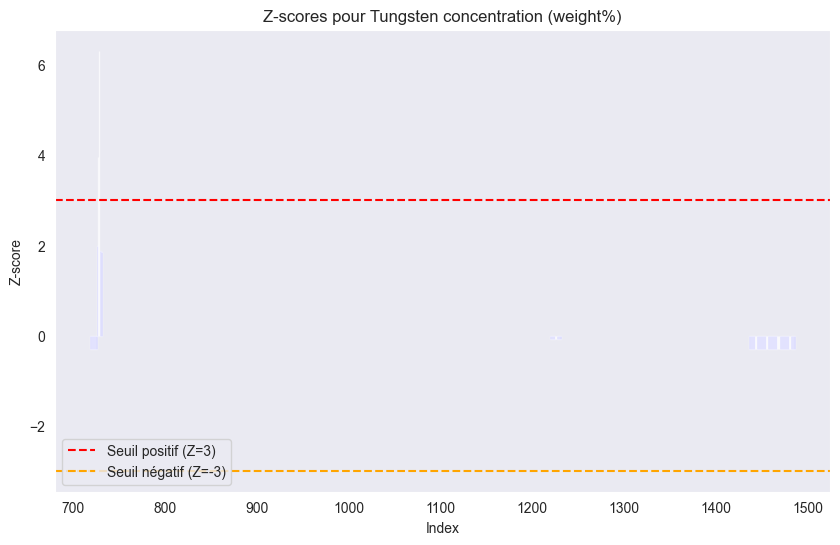

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


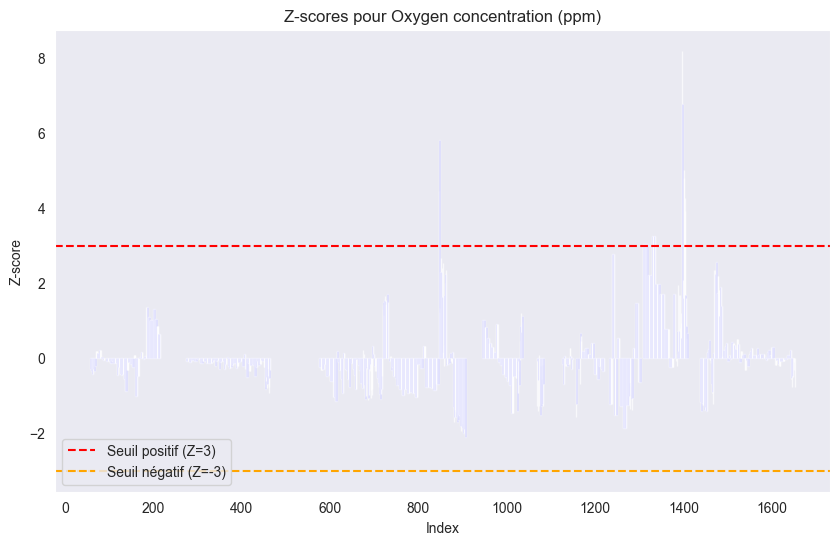

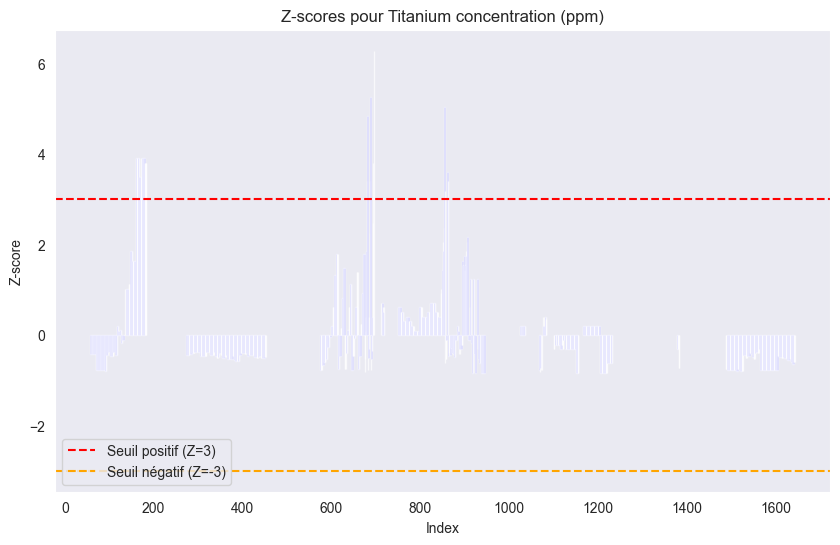

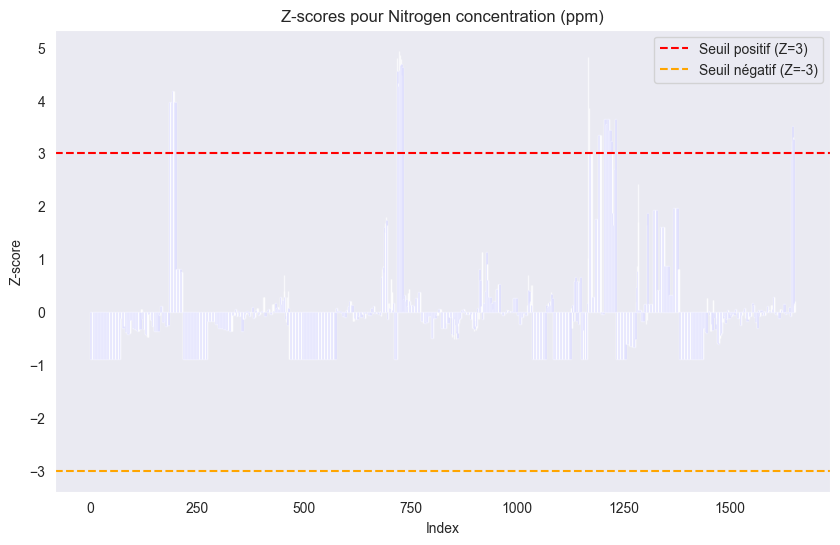

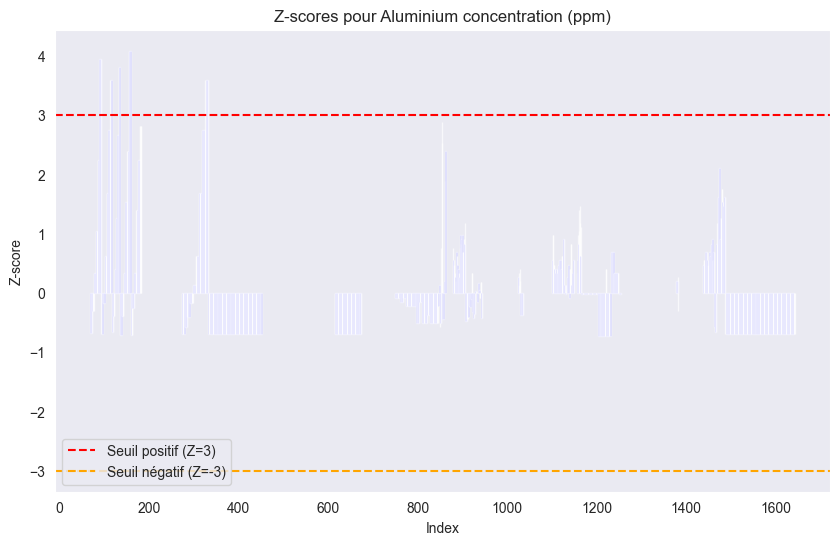

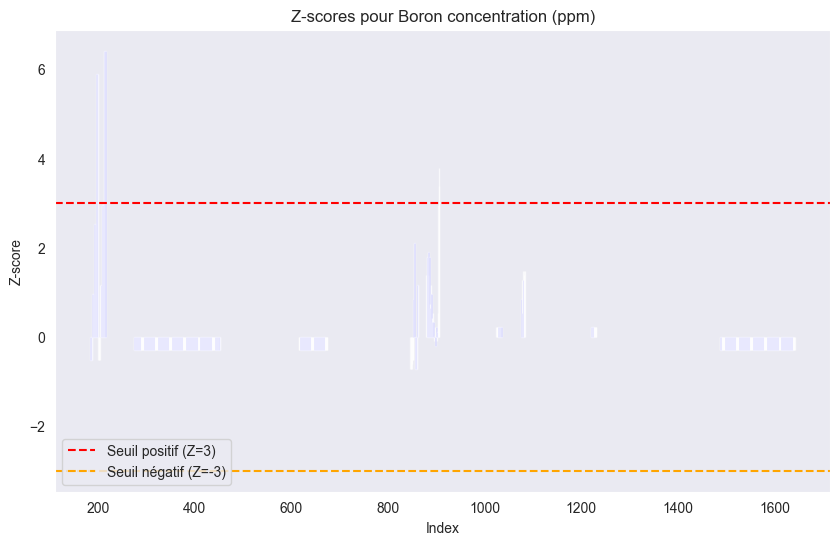

...

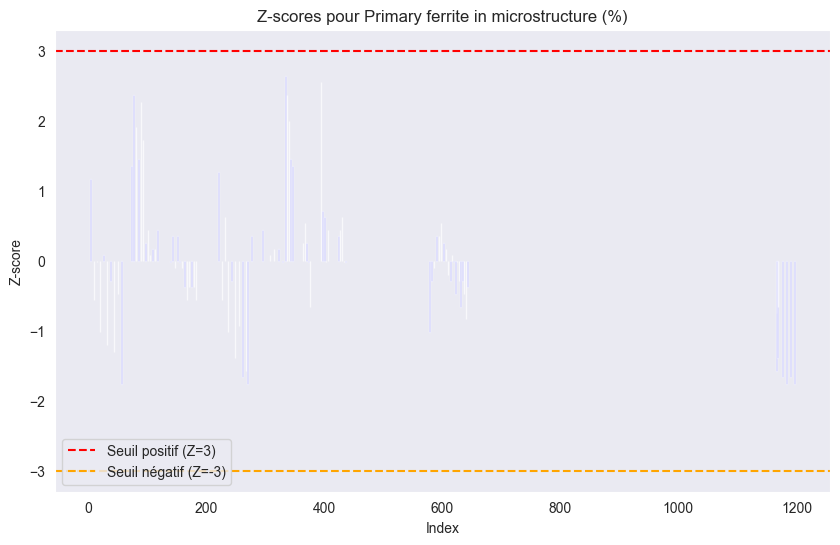

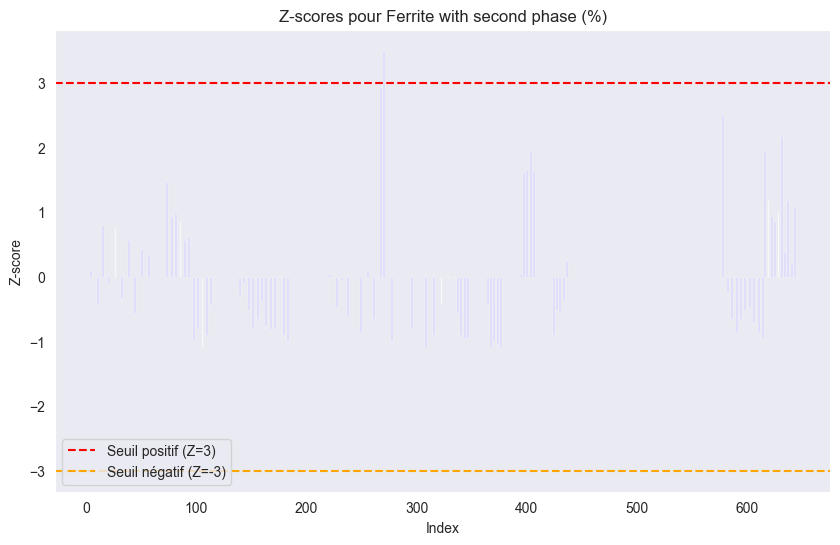

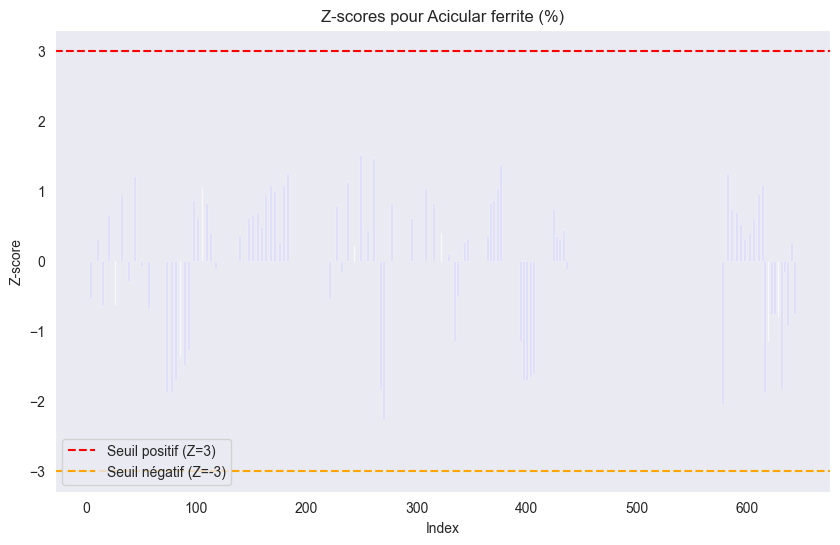

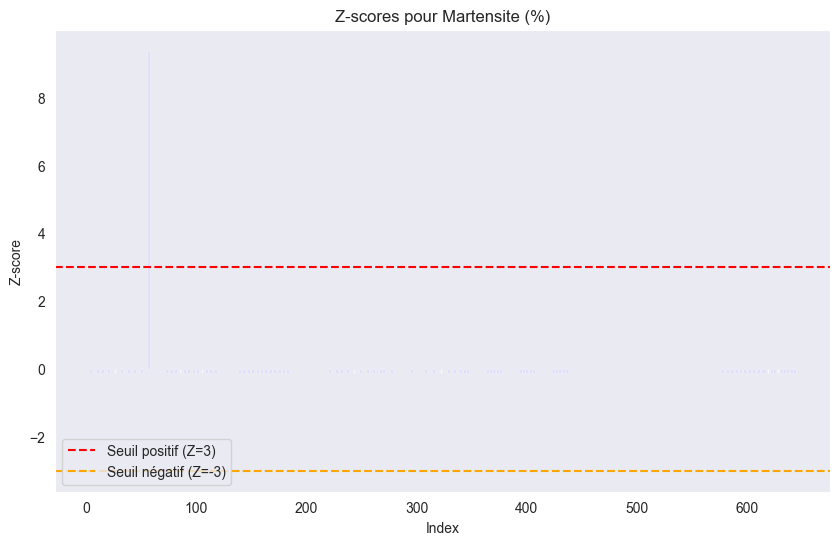

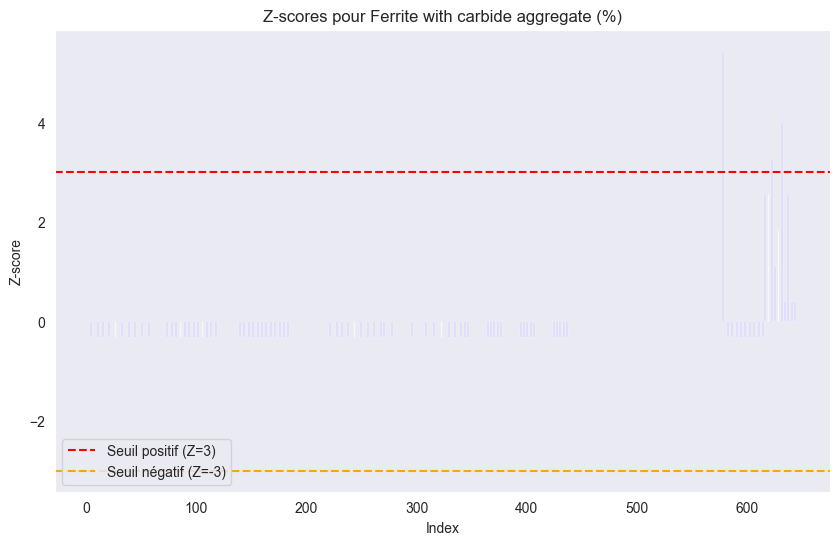

In [50]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import zscore

# Chargement des données
df = pd.read_csv("weld_data_converted.csv")

# Filtrer les colonnes numériques
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Calculer les Z-scores et créer un graphique pour chaque colonne
for column in numeric_columns:
    # Calculer le Z-score
    z_scores = zscore(df[column], nan_policy='omit')

    # Créer un graphique à barres pour les Z-scores
    plt.figure(figsize=(10, 6))
    plt.bar(range(len(z_scores)), z_scores, color='blue', alpha=0.7)
    plt.axhline(y=3, color='r', linestyle='--', label='Seuil positif (Z=3)')
    plt.axhline(y=-3, color='orange', linestyle='--', label='Seuil négatif (Z=-3)')
    
    plt.title(f"Z-scores pour {column}")
    plt.xlabel("Index")
    plt.ylabel("Z-score")
    plt.legend()
    plt.grid()
    plt.show()


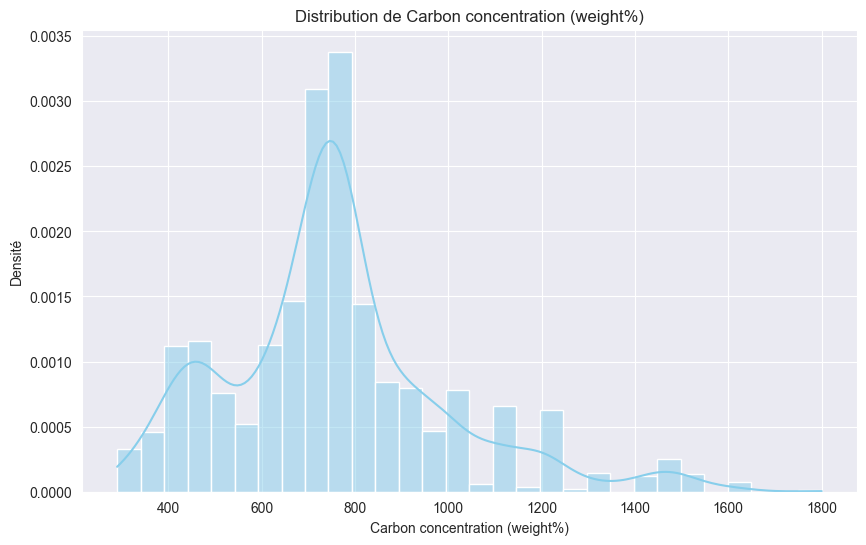

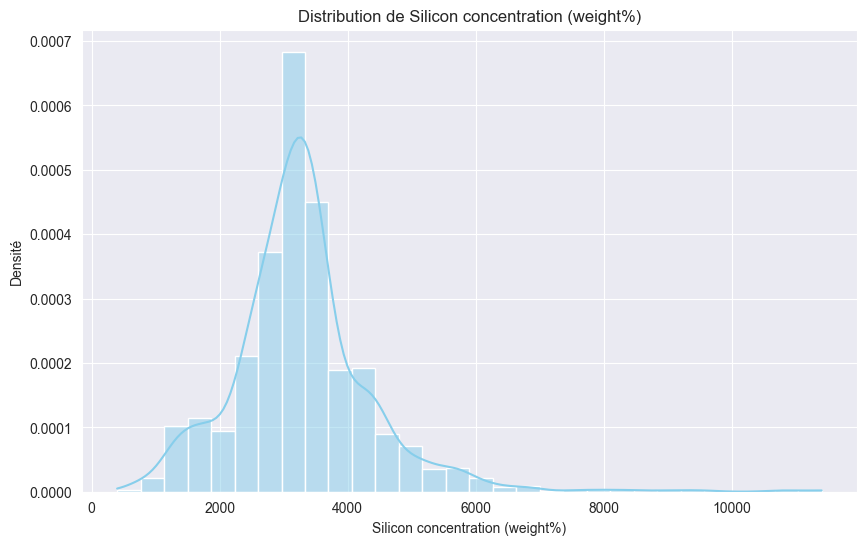

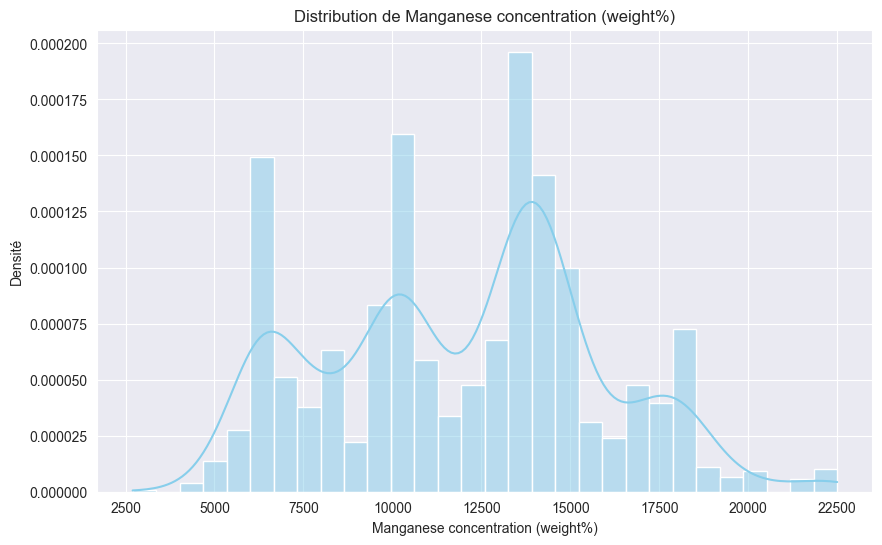

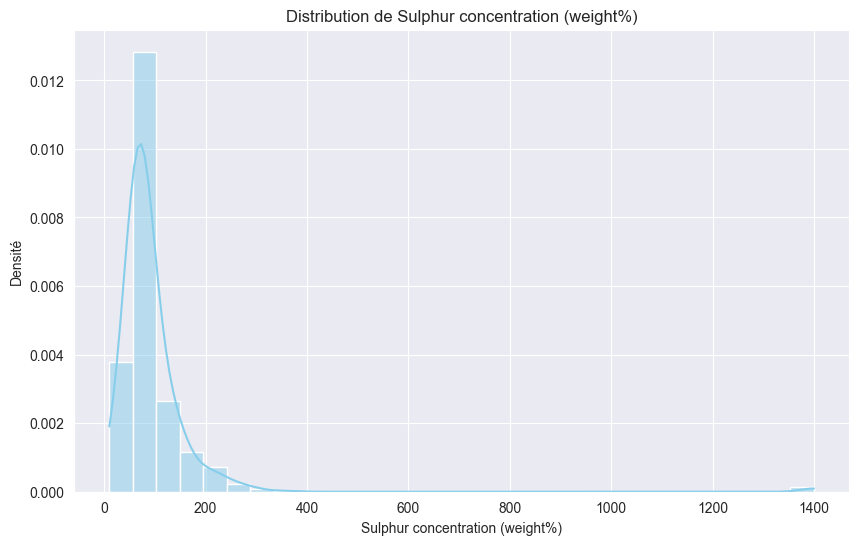

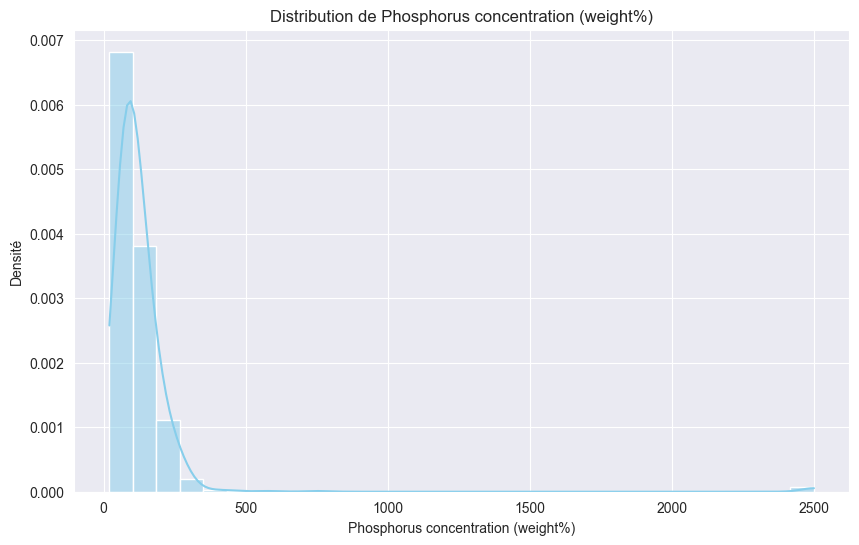

...

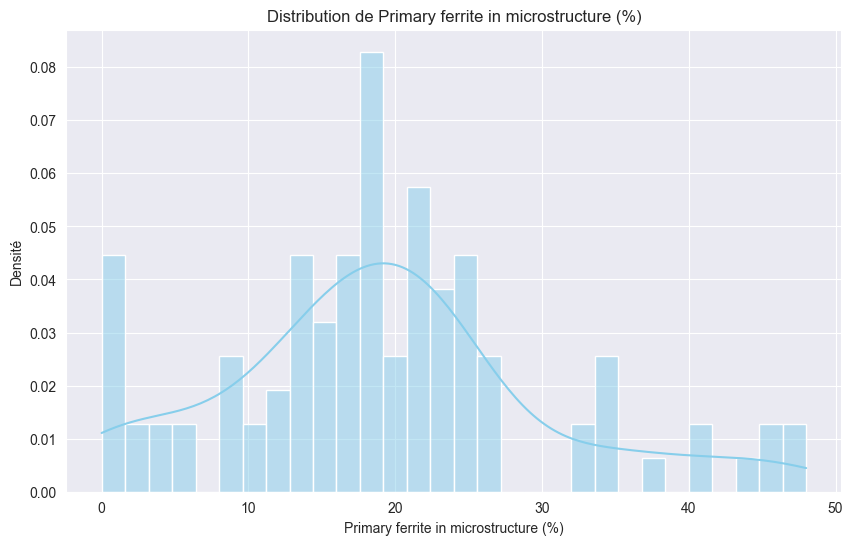

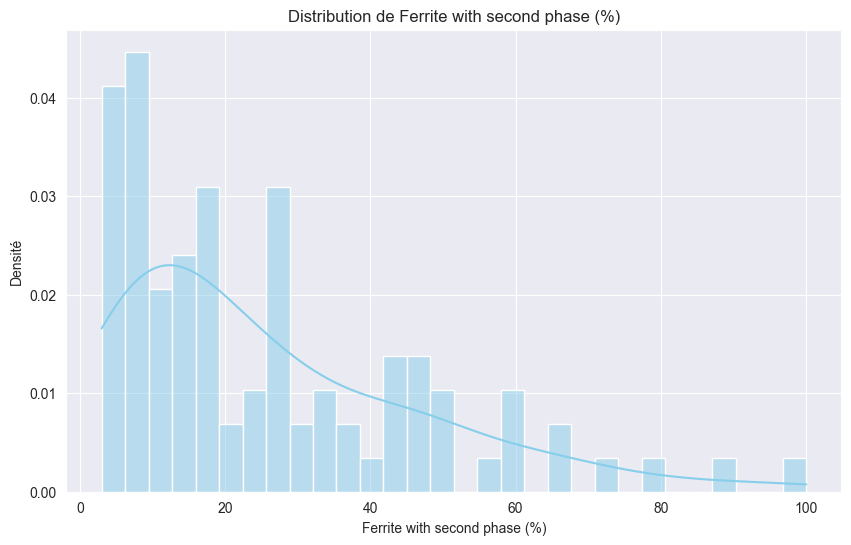

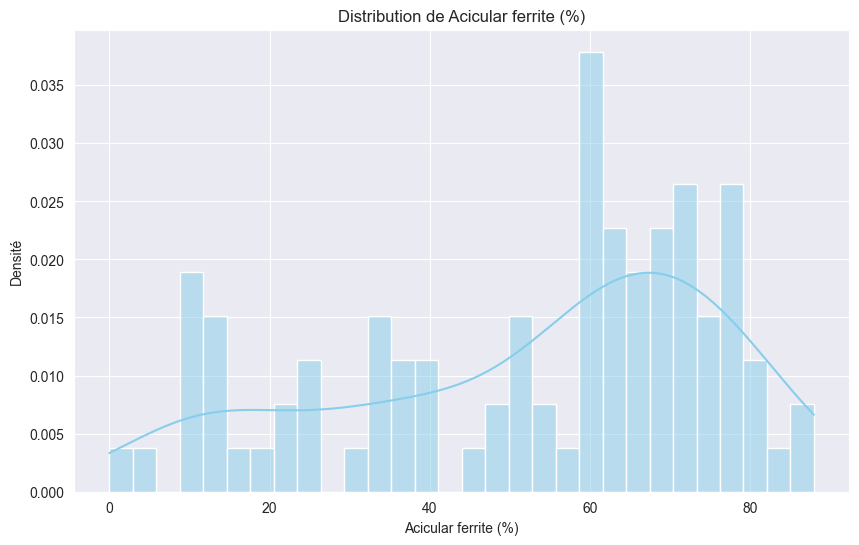

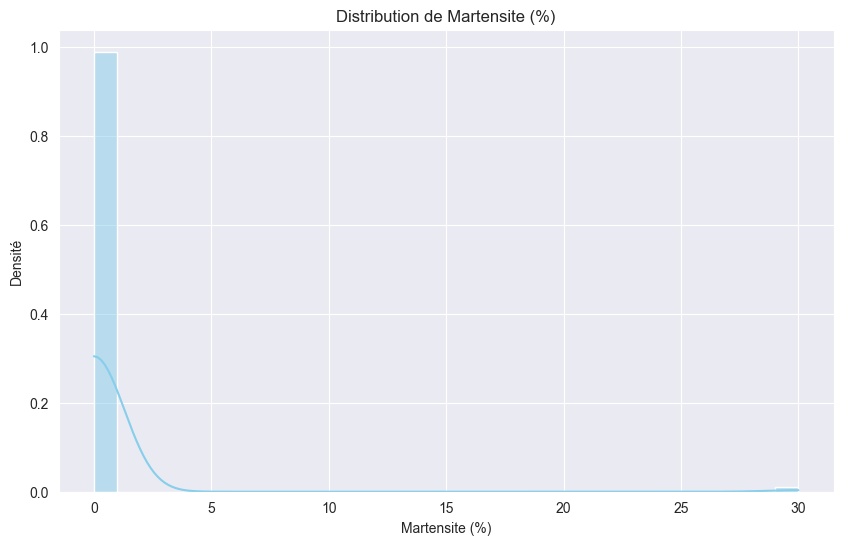

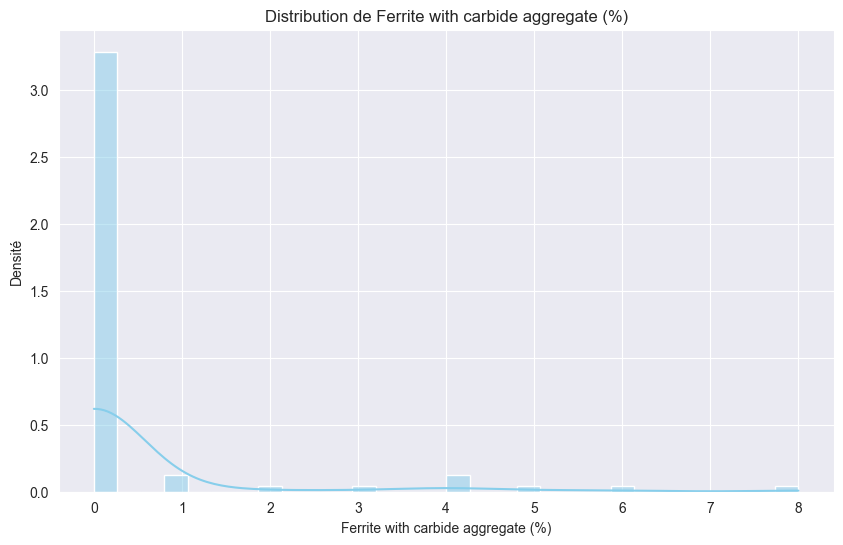

In [51]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Chargement des données
df = pd.read_csv("weld_data_converted.csv")

# Filtrer les colonnes numériques
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Tracer la distribution pour chaque colonne numérique
for column in numeric_columns:
    plt.figure(figsize=(10, 6))
    
    # Tracer l'histogramme et la courbe de densité
    sns.histplot(df[column], kde=True, stat="density", bins=30, color='skyblue')
    
    # Ajouter un titre et des labels
    plt.title(f"Distribution de {column}")
    plt.xlabel(column)
    plt.ylabel("Densité")
    
    # Afficher le graphique
    plt.show()


Évaluation de la normalité pour la colonne : Carbon concentration (weight%)
Statistique de Shapiro-Wilk : 0.9432, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


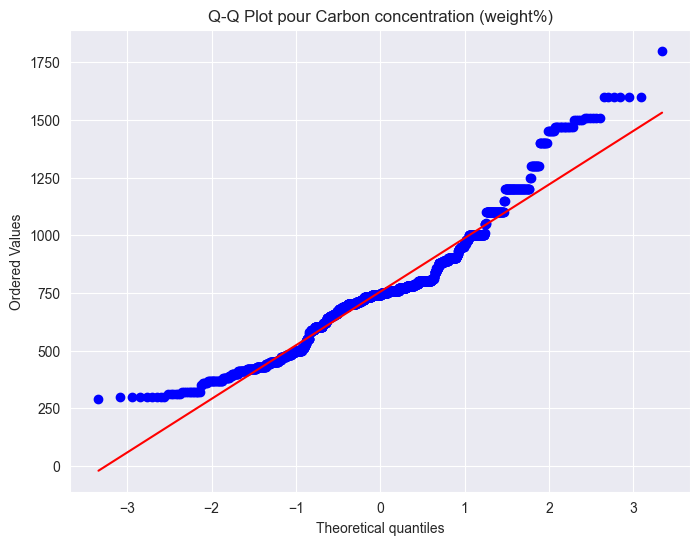


Évaluation de la normalité pour la colonne : Silicon concentration (weight%)
Statistique de Shapiro-Wilk : 0.8944, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


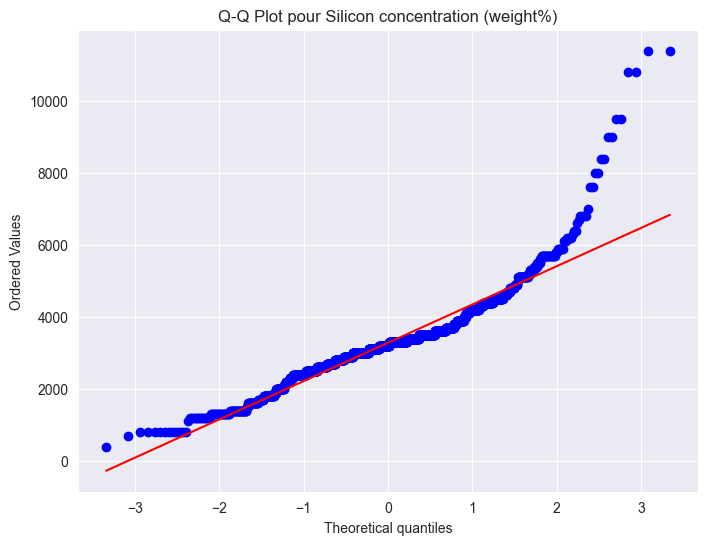


Évaluation de la normalité pour la colonne : Manganese concentration (weight%)
Statistique de Shapiro-Wilk : 0.9735, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


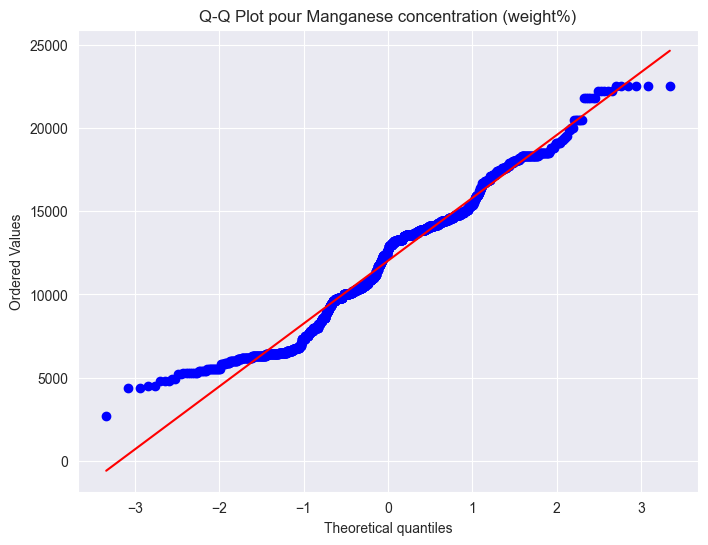


Évaluation de la normalité pour la colonne : Sulphur concentration (weight%)
Statistique de Shapiro-Wilk : 0.3195, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


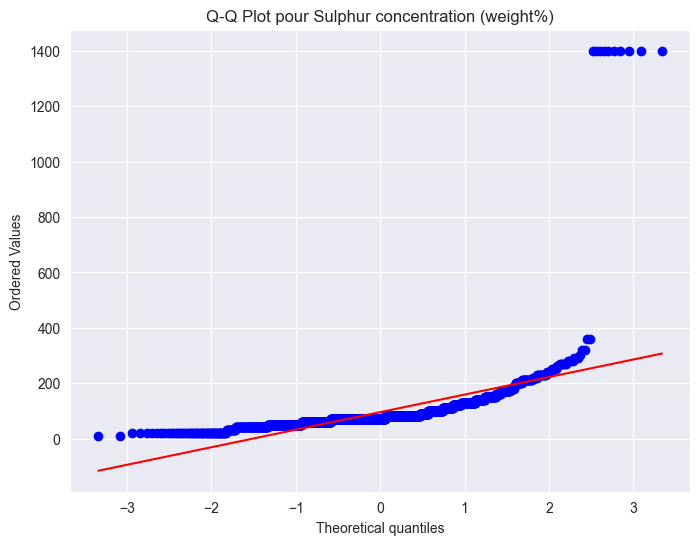


Évaluation de la normalité pour la colonne : Phosphorus concentration (weight%)
Statistique de Shapiro-Wilk : 0.2386, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


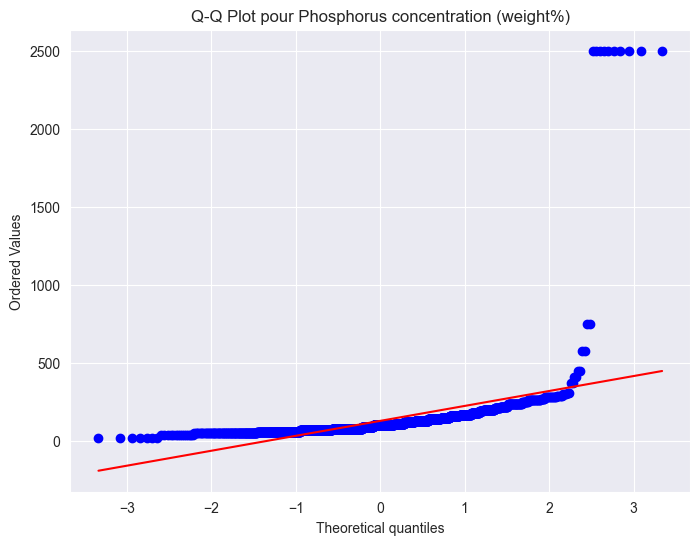


Évaluation de la normalité pour la colonne : Nickel concentration (weight%)
Statistique de Shapiro-Wilk : 0.5803, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


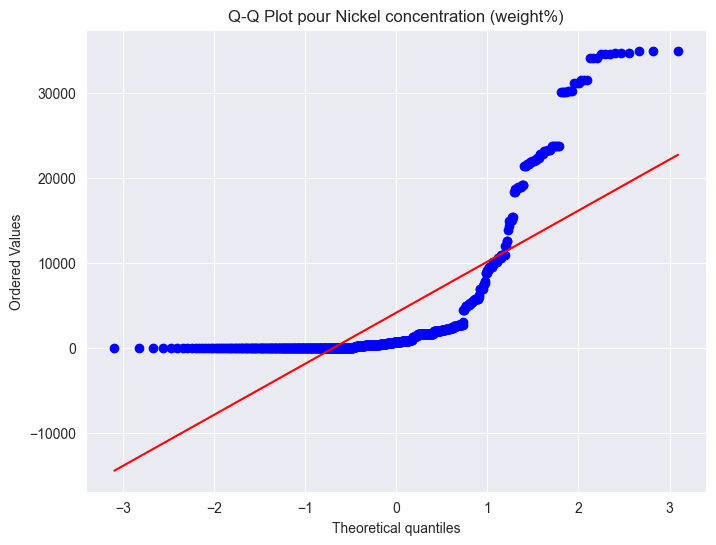


Évaluation de la normalité pour la colonne : Chromium concentration (weight%)
Statistique de Shapiro-Wilk : 0.6740, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


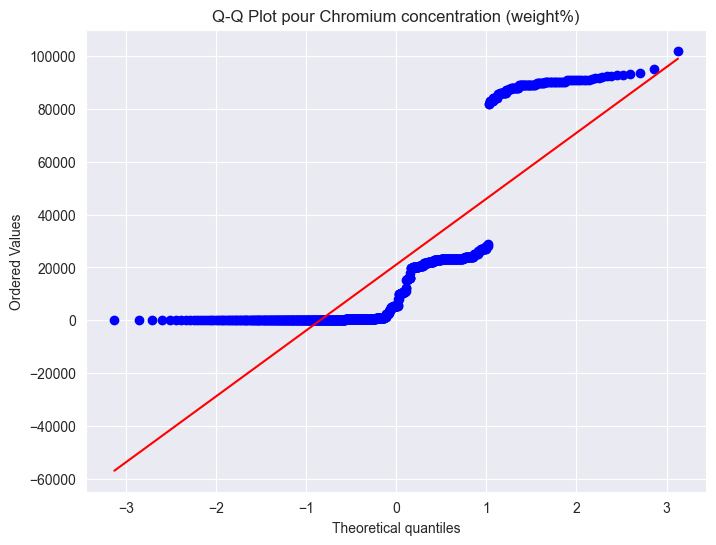


Évaluation de la normalité pour la colonne : Molybdenum concentration (weight%)
Statistique de Shapiro-Wilk : 0.7888, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


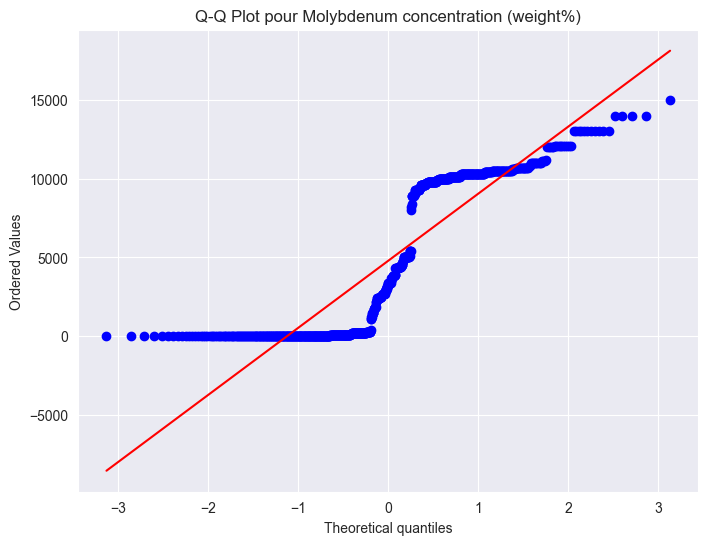


Évaluation de la normalité pour la colonne : Vanadium concentration (weight%)
Statistique de Shapiro-Wilk : 0.1521, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


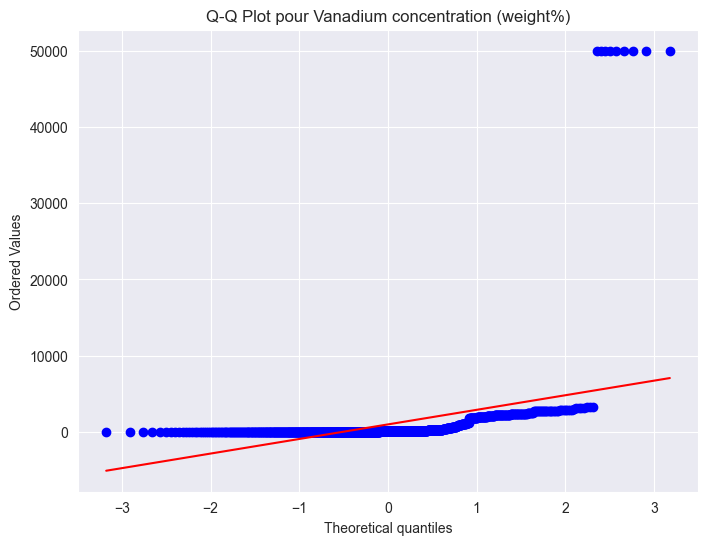


Évaluation de la normalité pour la colonne : Copper concentration (weight%)
Statistique de Shapiro-Wilk : 0.5791, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


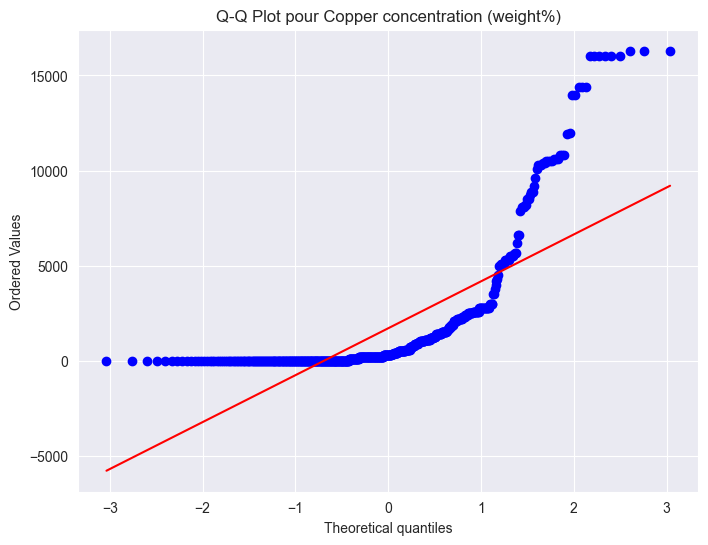


Évaluation de la normalité pour la colonne : Cobalt concentration (weight%)
Statistique de Shapiro-Wilk : 0.1948, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


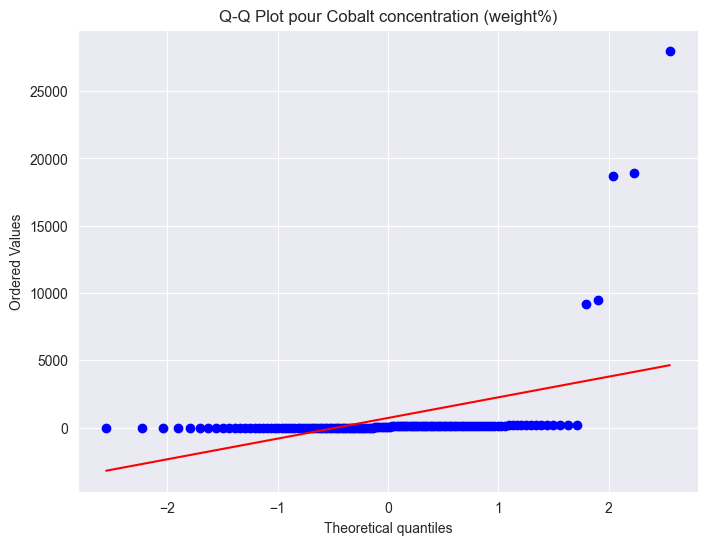


Évaluation de la normalité pour la colonne : Tungsten concentration (weight%)
Statistique de Shapiro-Wilk : 0.3293, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


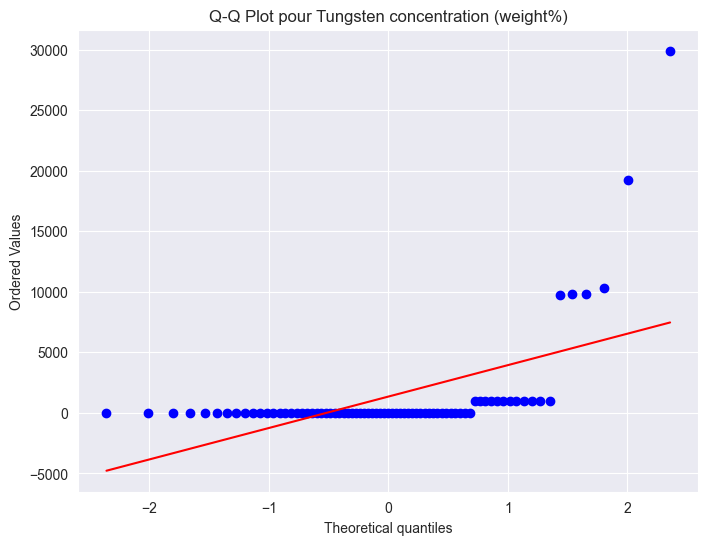


Évaluation de la normalité pour la colonne : Oxygen concentration (ppm)
Statistique de Shapiro-Wilk : 0.8498, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


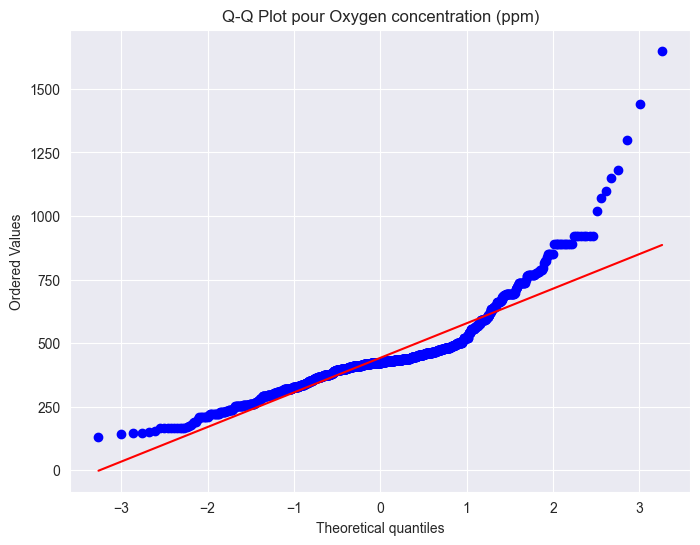


Évaluation de la normalité pour la colonne : Titanium concentration (ppm)
Statistique de Shapiro-Wilk : 0.7023, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


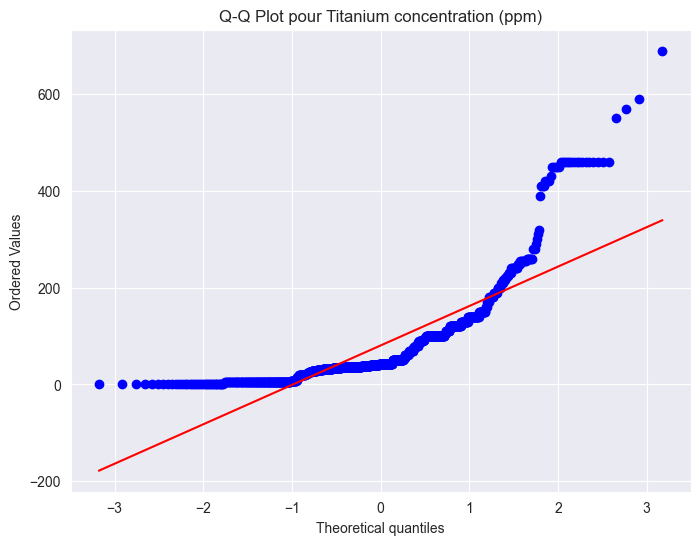


Évaluation de la normalité pour la colonne : Nitrogen concentration (ppm)
Statistique de Shapiro-Wilk : 0.6991, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


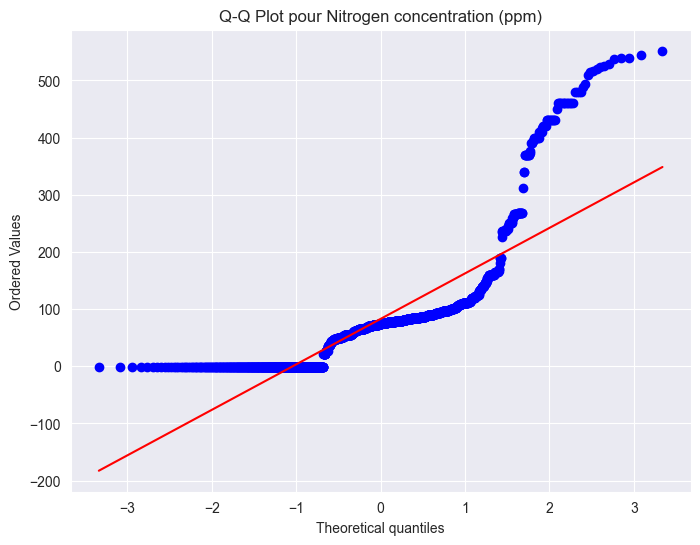


Évaluation de la normalité pour la colonne : Aluminium concentration (ppm)
Statistique de Shapiro-Wilk : 0.7227, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


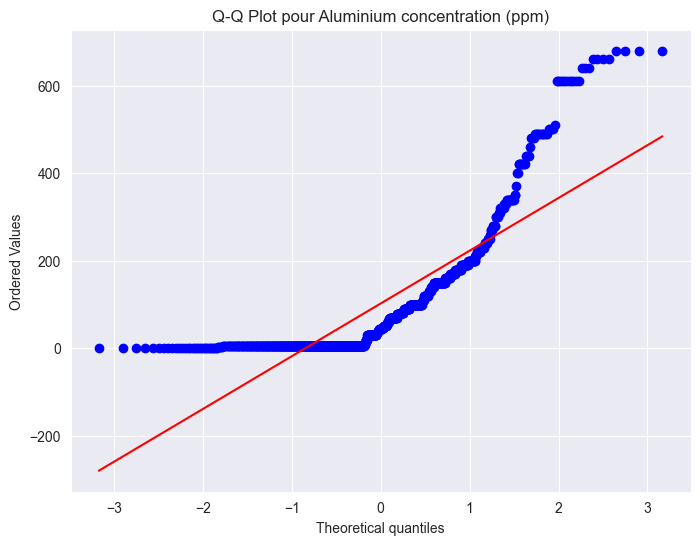


Évaluation de la normalité pour la colonne : Boron concentration (ppm)
Statistique de Shapiro-Wilk : 0.3874, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


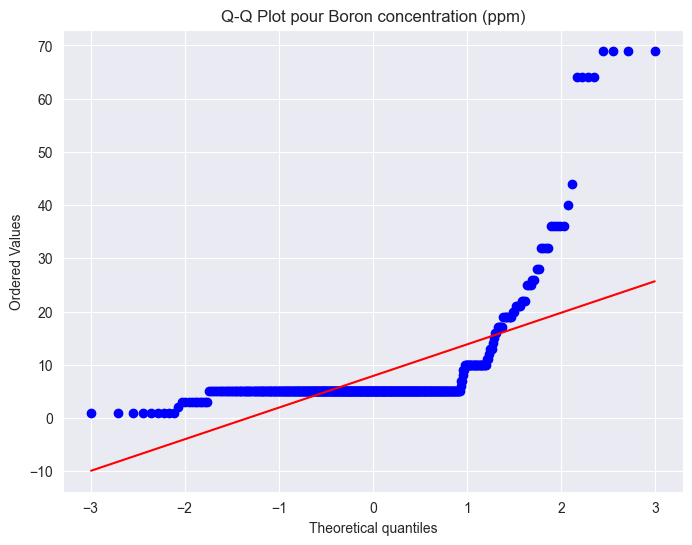


Évaluation de la normalité pour la colonne : Niobium concentration (ppm)
Statistique de Shapiro-Wilk : 0.6365, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


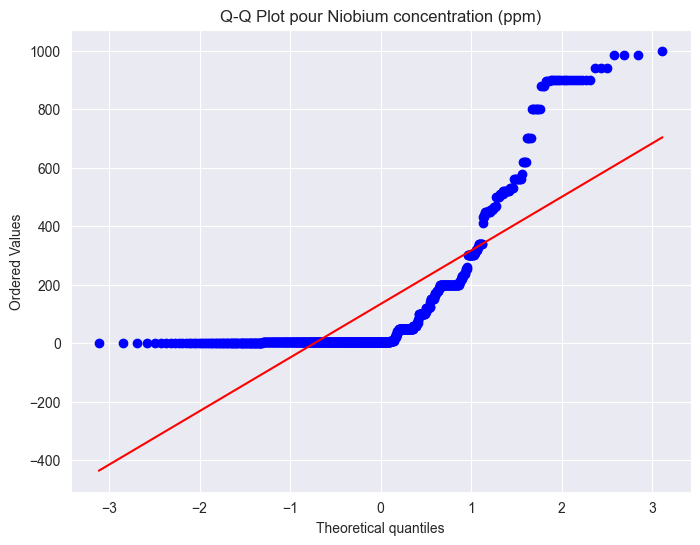


Évaluation de la normalité pour la colonne : Tin concentration (ppm)
Statistique de Shapiro-Wilk : 0.3554, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


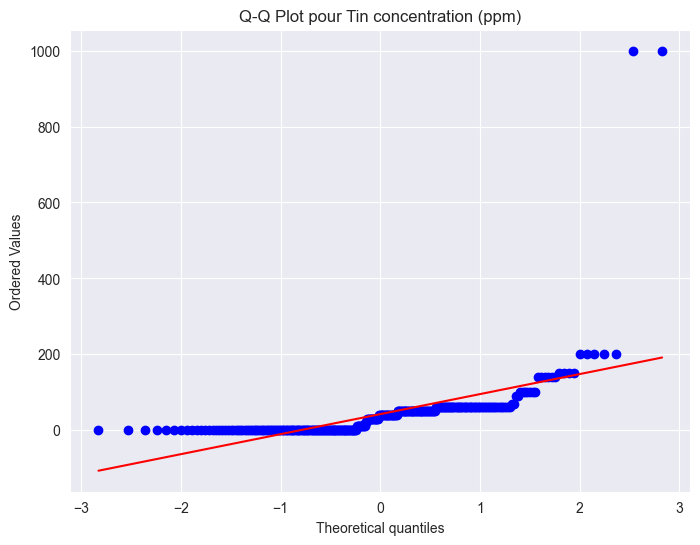


Évaluation de la normalité pour la colonne : Arsenic concentration (ppm)
Statistique de Shapiro-Wilk : 0.7322, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


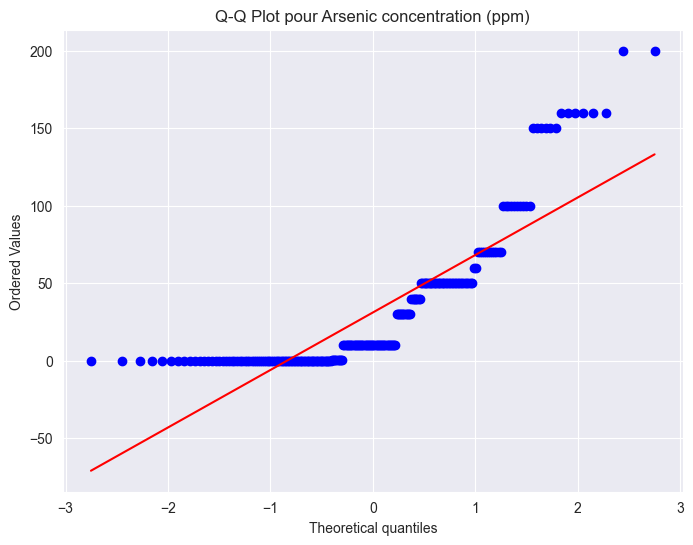


Évaluation de la normalité pour la colonne : Antimony concentration (ppm)
Statistique de Shapiro-Wilk : 0.7947, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


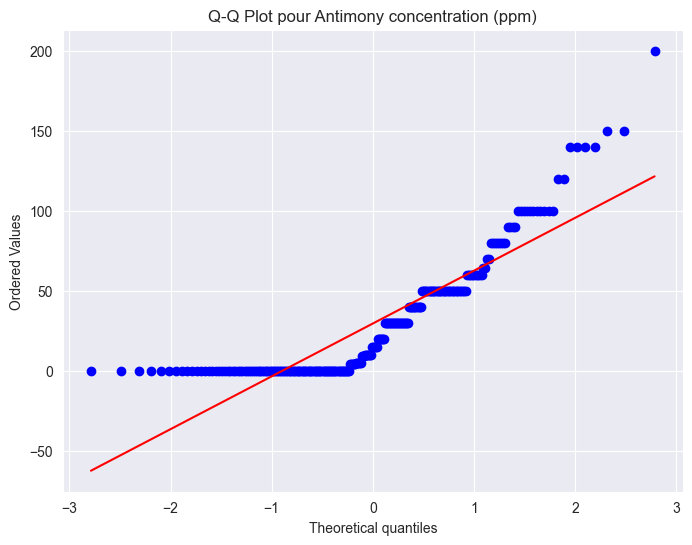


Évaluation de la normalité pour la colonne : Current (A)
Statistique de Shapiro-Wilk : 0.6673, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


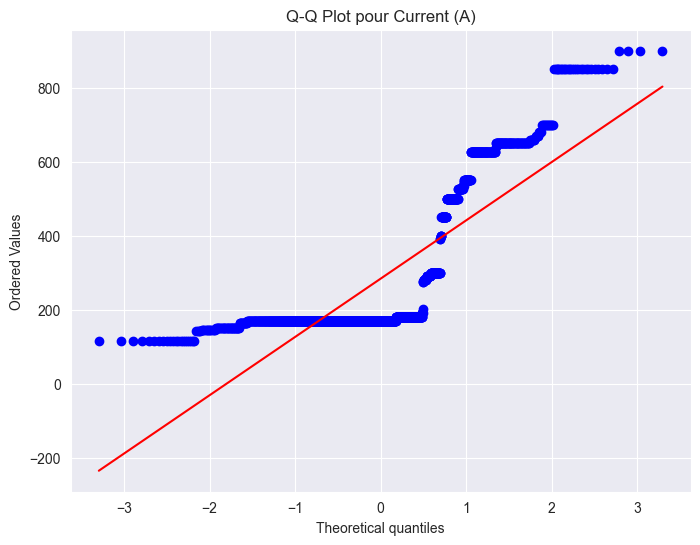


Évaluation de la normalité pour la colonne : Voltage (V)
Statistique de Shapiro-Wilk : 0.5637, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


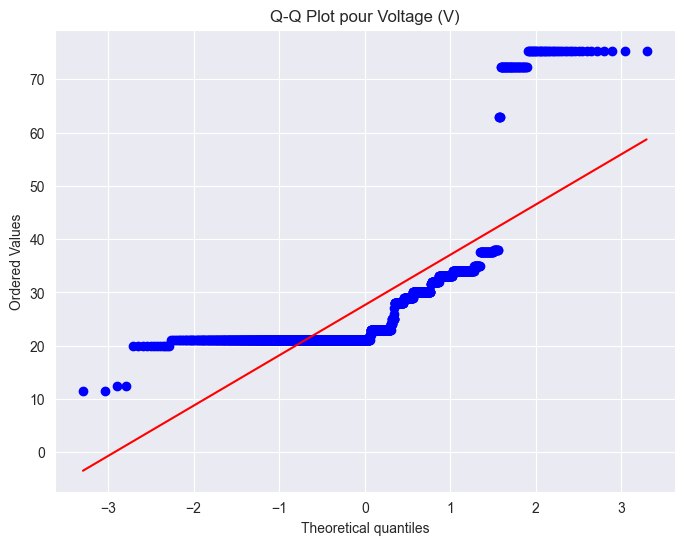


Évaluation de la normalité pour la colonne : AC or DC
Statistique de Shapiro-Wilk : 0.1562, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


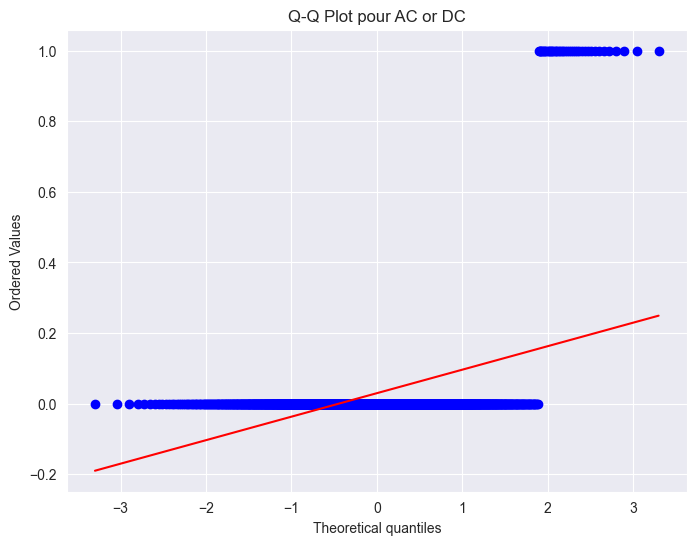


Évaluation de la normalité pour la colonne : Electrode positive or negative
Statistique de Shapiro-Wilk : 0.4031, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


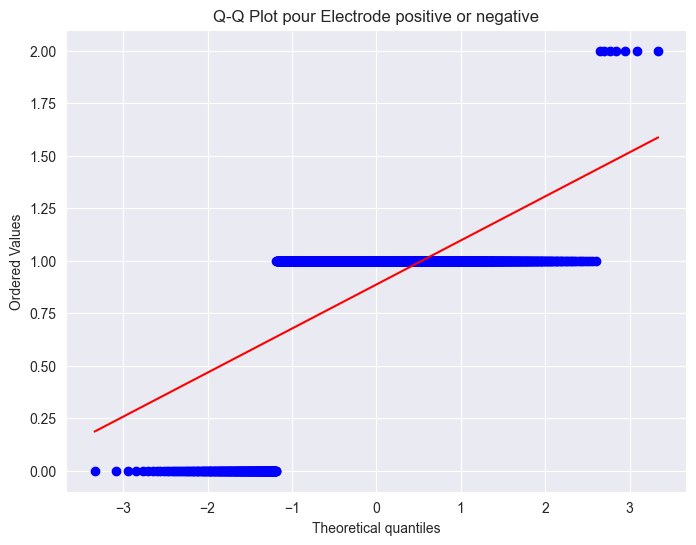


Évaluation de la normalité pour la colonne : Heat input (kJ/mm)
Statistique de Shapiro-Wilk : 0.6169, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


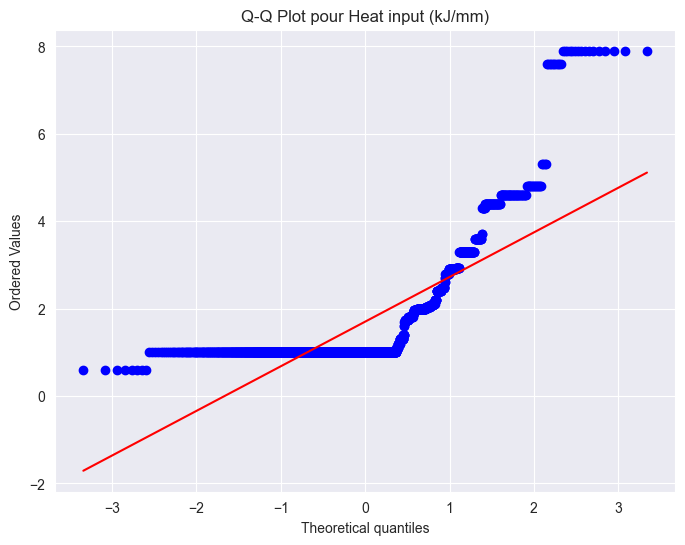


Évaluation de la normalité pour la colonne : Interpass temperature (deg C)
Statistique de Shapiro-Wilk : 0.7814, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


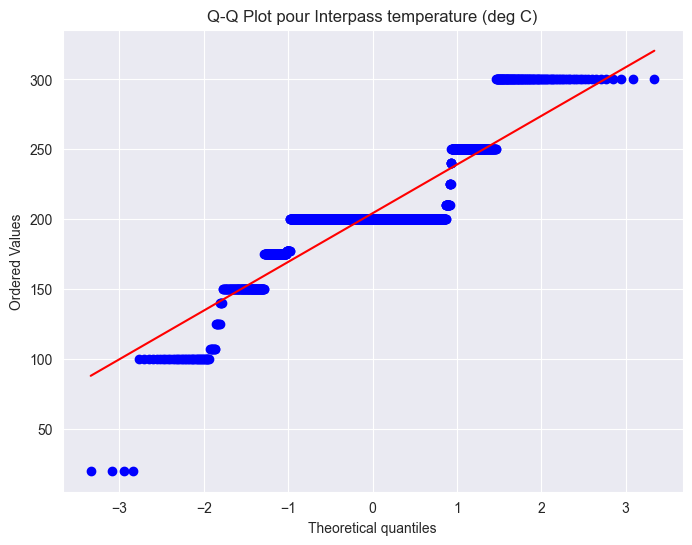


Évaluation de la normalité pour la colonne : Type of weld
Statistique de Shapiro-Wilk : 0.5728, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


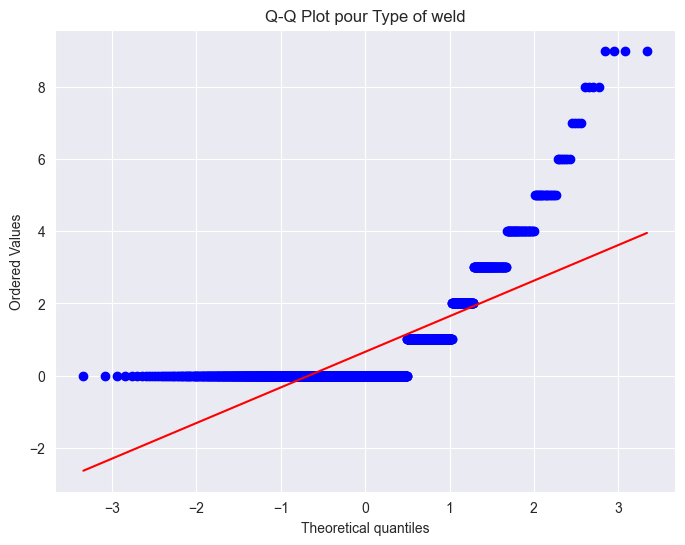


Évaluation de la normalité pour la colonne : Post weld heat treatment temperature (deg C)
Statistique de Shapiro-Wilk : 0.8212, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


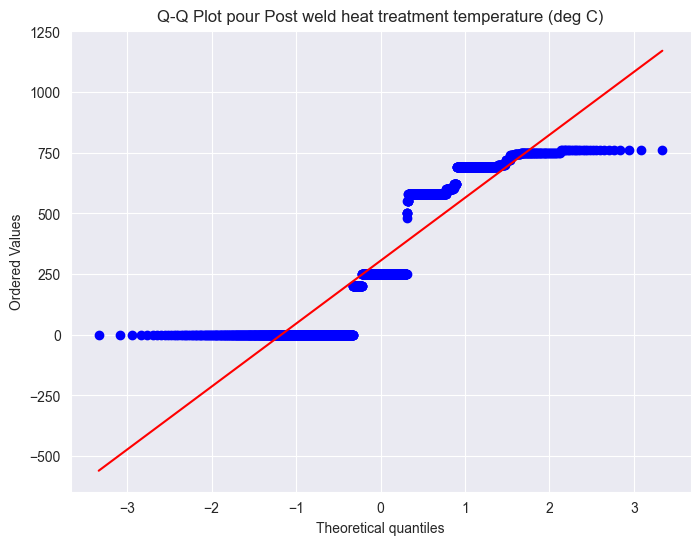


Évaluation de la normalité pour la colonne : Post weld heat treatment time (hours)
Statistique de Shapiro-Wilk : 0.7612, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


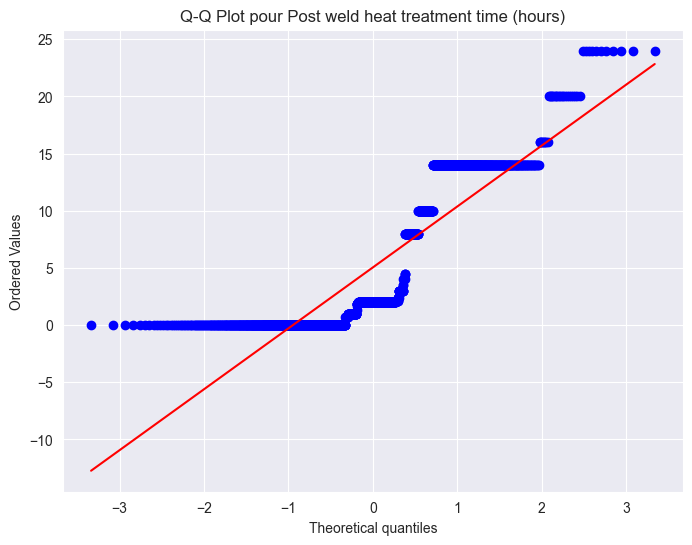


Évaluation de la normalité pour la colonne : Yield strength (MPa)
Statistique de Shapiro-Wilk : 0.9612, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


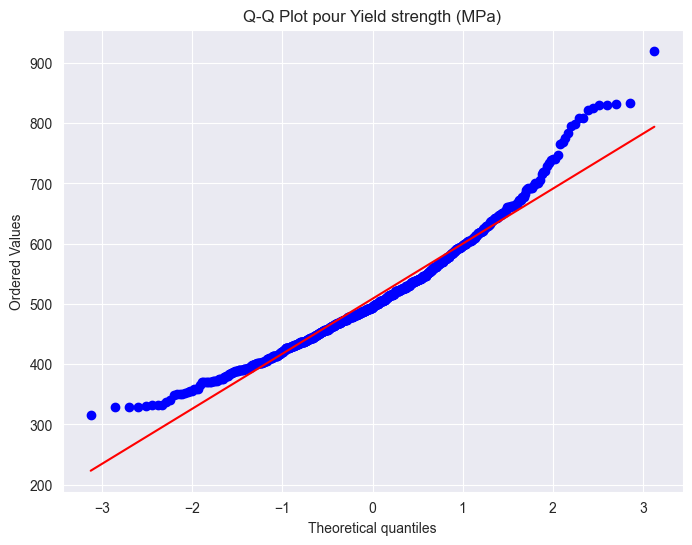


Évaluation de la normalité pour la colonne : Ultimate tensile strength (MPa)
Statistique de Shapiro-Wilk : 0.9391, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


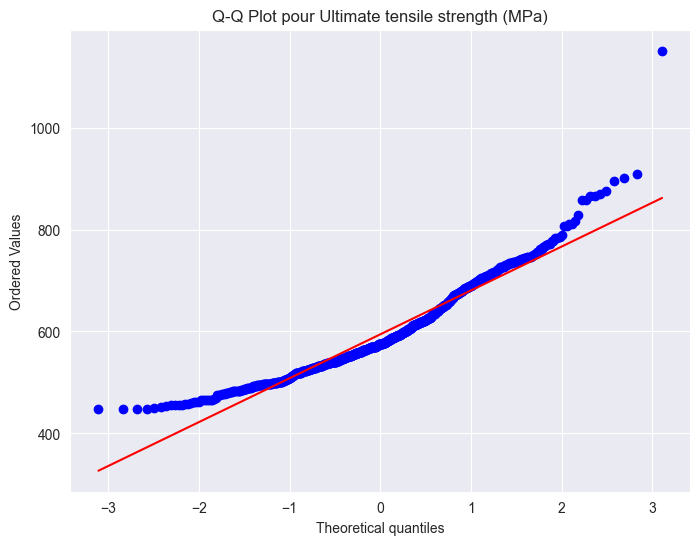


Évaluation de la normalité pour la colonne : Elongation (%)
Statistique de Shapiro-Wilk : 0.9818, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


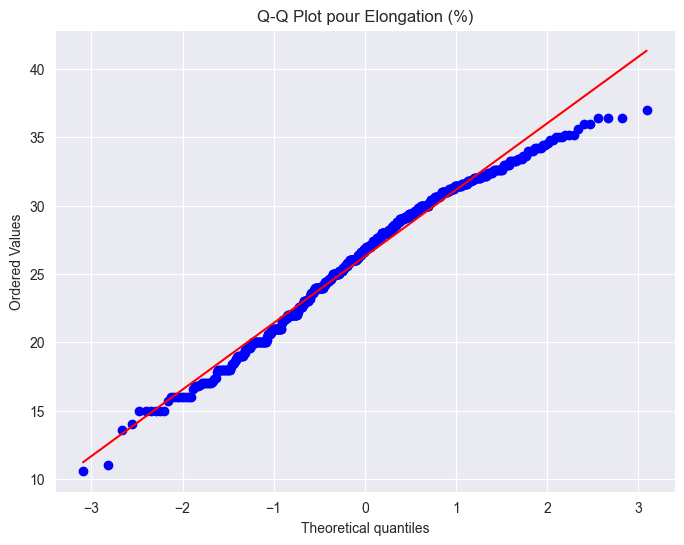


Évaluation de la normalité pour la colonne : Reduction of Area (%)
Statistique de Shapiro-Wilk : 0.8302, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


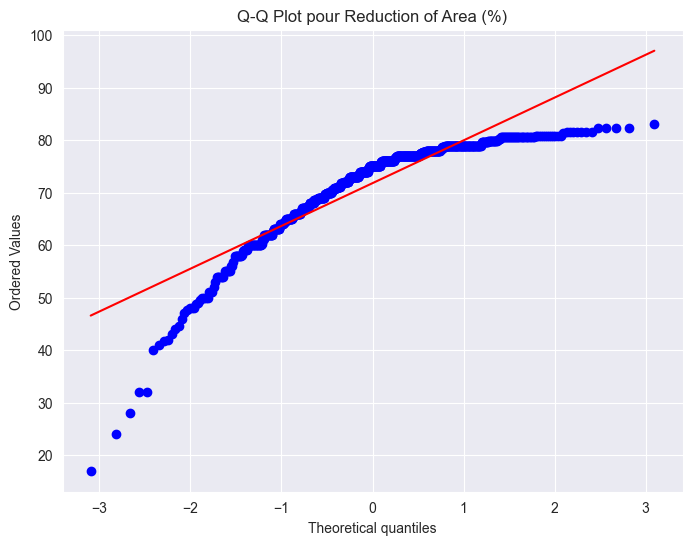


Évaluation de la normalité pour la colonne : Charpy temperature (deg C)
Statistique de Shapiro-Wilk : 0.9526, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


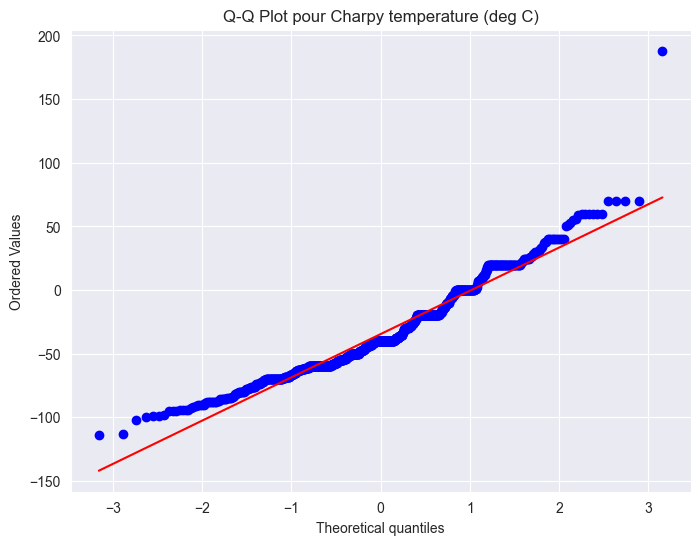


Évaluation de la normalité pour la colonne : Charpy impact toughness (J)
Statistique de Shapiro-Wilk : 0.9069, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


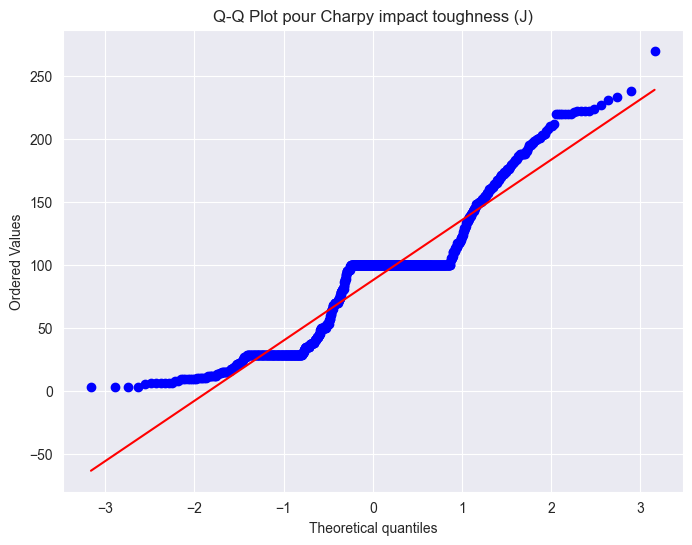


Évaluation de la normalité pour la colonne : Hardness (kg/mm2)
Statistique de Shapiro-Wilk : 0.3185, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


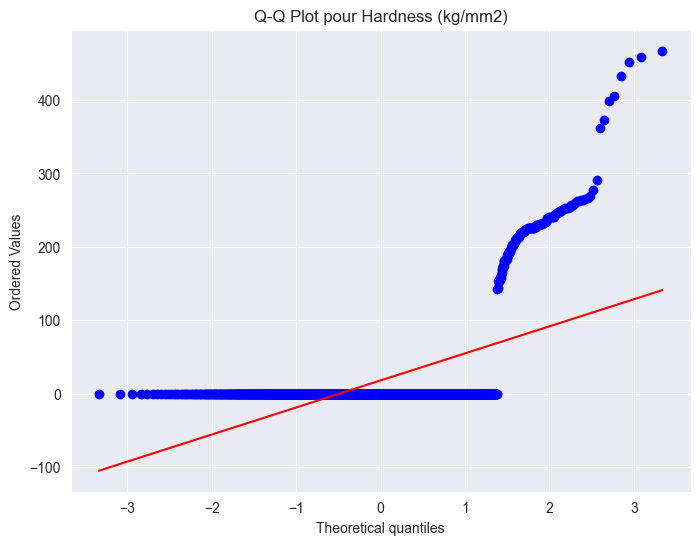


Évaluation de la normalité pour la colonne : 50 % FATT
Statistique de Shapiro-Wilk : 0.9127, p-value : 0.0152
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


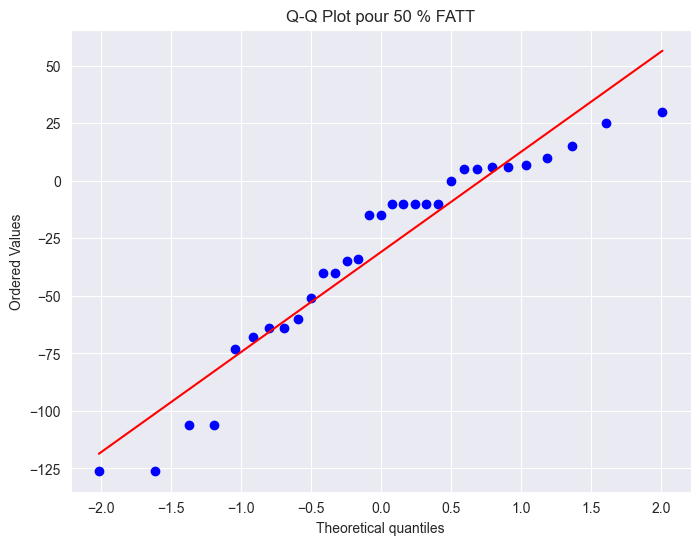


Évaluation de la normalité pour la colonne : Primary ferrite in microstructure (%)
Statistique de Shapiro-Wilk : 0.9513, p-value : 0.0012
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


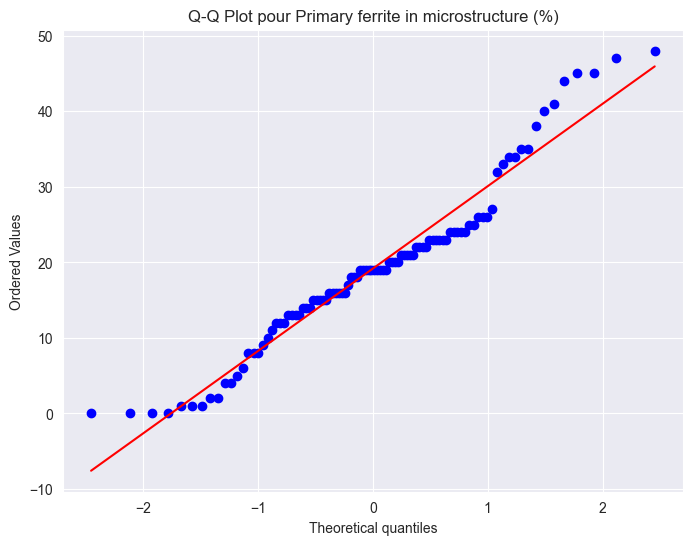


Évaluation de la normalité pour la colonne : Ferrite with second phase (%)
Statistique de Shapiro-Wilk : 0.8726, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


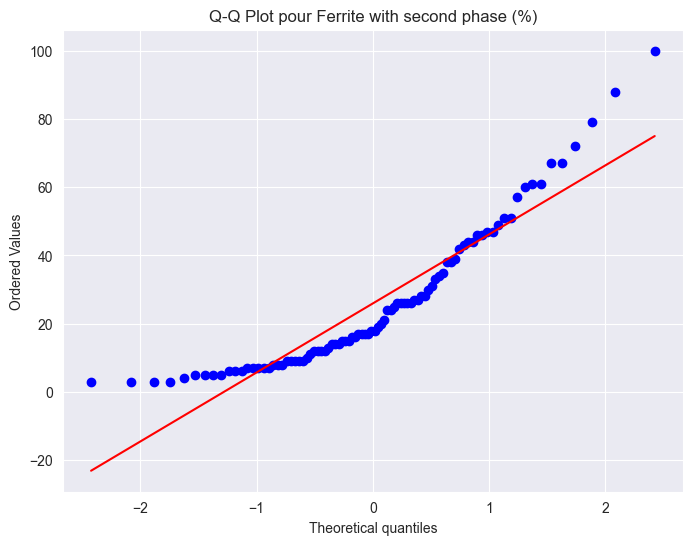


Évaluation de la normalité pour la colonne : Acicular ferrite (%)
Statistique de Shapiro-Wilk : 0.9175, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


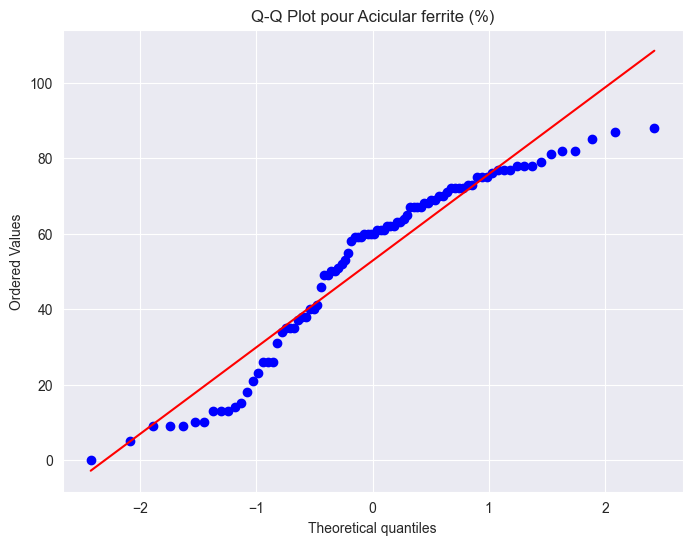


Évaluation de la normalité pour la colonne : Martensite (%)
Statistique de Shapiro-Wilk : 0.0821, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


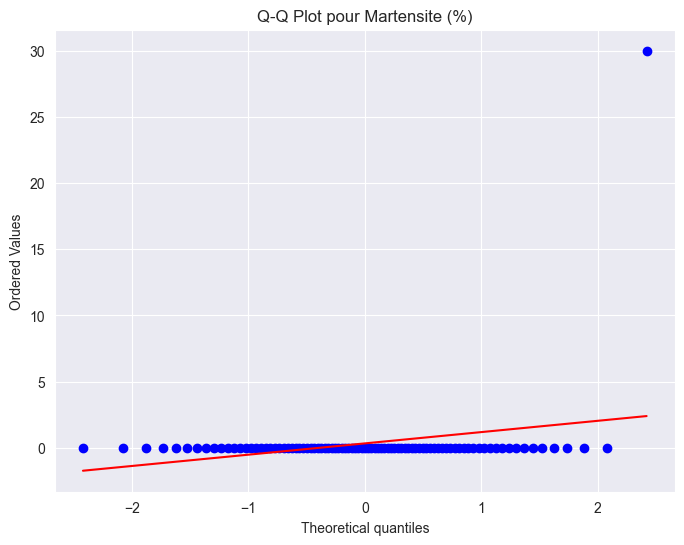


Évaluation de la normalité pour la colonne : Ferrite with carbide aggregate (%)
Statistique de Shapiro-Wilk : 0.3602, p-value : 0.0000
On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.


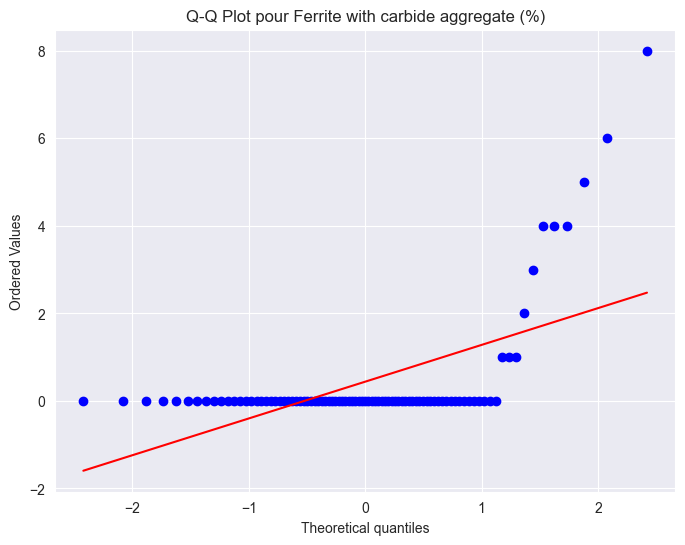

In [52]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import shapiro, probplot

# Chargement des données
df = pd.read_csv("weld_data_converted.csv")

# Filtrer les colonnes numériques
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Évaluer la normalité pour chaque colonne
for column in numeric_columns:
    # Afficher le nom de la colonne
    print(f"Évaluation de la normalité pour la colonne : {column}")

    # 1. Test de Shapiro-Wilk
    stat, p_value = shapiro(df[column].dropna())  # Ignorer les NaN
    print(f"Statistique de Shapiro-Wilk : {stat:.4f}, p-value : {p_value:.4f}")
    
    # Décision basée sur la p-value
    if p_value > 0.05:
        print("On ne rejette pas l'hypothèse nulle : les données suivent une distribution normale.")
    else:
        print("On rejette l'hypothèse nulle : les données ne suivent pas une distribution normale.")
    
    # 2. Q-Q Plot
    plt.figure(figsize=(8, 6))
    probplot(df[column].dropna(), dist="norm", plot=plt)
    plt.title(f"Q-Q Plot pour {column}")
    plt.show()
    
    print()  # Ligne vide pour une meilleure lisibilité


In [53]:
import pandas as pd

def detect_outliers_iqr(df, variable):
    # Calculer Q1 (25e percentile) et Q3 (75e percentile)
    Q1 = df[variable].quantile(0.25)
    Q3 = df[variable].quantile(0.75)
    
    # Calculer l'IQR
    IQR = Q3 - Q1
    
    # Définir les seuils pour les valeurs aberrantes
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Identifier les valeurs aberrantes
    outliers = df[(df[variable] < lower_bound) | (df[variable] > upper_bound)]
    
    # Compter le nombre de valeurs aberrantes
    num_outliers = outliers.shape[0]
    
    return num_outliers

# Chargement des données
df = pd.read_csv("weld_data_converted.csv")

# Filtrer les colonnes numériques
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Dictionnaire pour stocker les résultats
column_info = {}

# Analyser chaque colonne numérique
for column in numeric_columns:
    num_outliers = detect_outliers_iqr(df, column)
    num_existing = df[column].count()  # Nombre de valeurs existantes
    num_missing = df[column].isna().sum()  # Nombre de valeurs manquantes
    
    # Stocker les résultats dans le dictionnaire
    column_info[column] = {
        "num_outliers": num_outliers,
        "num_existing": num_existing,
        "num_missing": num_missing
    }

# Afficher les résultats pour chaque colonne
for column, info in column_info.items():
    print(f"Colonne: {column}, Nombre de valeurs aberrantes: {info['num_outliers']}, "
          f"Valeurs existantes: {info['num_existing']}, Valeurs manquantes: {info['num_missing']}")


Colonne: Carbon concentration (weight%), Nombre de valeurs aberrantes: 63, Valeurs existantes: 1652, Valeurs manquantes: 0
Colonne: Silicon concentration (weight%), Nombre de valeurs aberrantes: 153, Valeurs existantes: 1652, Valeurs manquantes: 0
Colonne: Manganese concentration (weight%), Nombre de valeurs aberrantes: 11, Valeurs existantes: 1652, Valeurs manquantes: 0
Colonne: Sulphur concentration (weight%), Nombre de valeurs aberrantes: 126, Valeurs existantes: 1648, Valeurs manquantes: 4
Colonne: Phosphorus concentration (weight%), Nombre de valeurs aberrantes: 76, Valeurs existantes: 1642, Valeurs manquantes: 10
Colonne: Nickel concentration (weight%), Nombre de valeurs aberrantes: 126, Valeurs existantes: 697, Valeurs manquantes: 955
Colonne: Chromium concentration (weight%), Nombre de valeurs aberrantes: 120, Valeurs existantes: 784, Valeurs manquantes: 868
Colonne: Molybdenum concentration (weight%), Nombre de valeurs aberrantes: 0, Valeurs existantes: 793, Valeurs manquantes

In [54]:
import pandas as pd
from fancyimpute import KNN

# Chargement des données
df = pd.read_csv("weld_data_converted.csv")

# Sélection des colonnes pour l'imputation
# (Tu peux modifier cette liste selon tes besoins)
columns_to_impute = [
    "Nickel concentration (weight%)",
    "Chromium concentration (weight%)",
    "Molybdenum concentration (weight%)",
    "Vanadium concentration (weight%)",
    "Copper concentration (weight%)",
    "Titanium concentration (ppm)",
    "Aluminium concentration (ppm)",
    "Boron concentration (ppm)",
    "Niobium concentration (ppm)",
    "Tin concentration (ppm)",
    "Yield strength (MPa)",
    "Ultimate tensile strength (MPa)",
    "Elongation (%)",
    "Reduction of Area (%)",
    "Charpy temperature (deg C)",
    "Charpy impact toughness (J)"
    # Ajoute d'autres colonnes que tu souhaites imputer
]

# Création d'une nouvelle DataFrame pour l'imputation
df_to_impute = df[columns_to_impute]

# Application de l'imputation multivariée
imputed_data = KNN(k=5).fit_transform(df_to_impute)

# Création d'une nouvelle DataFrame avec les données imputées
df_imputed = pd.DataFrame(imputed_data, columns=columns_to_impute)

# Ajouter les colonnes non imputées à la nouvelle DataFrame
df_imputed = pd.concat([df.drop(columns=columns_to_impute).reset_index(drop=True), df_imputed], axis=1)

# Afficher un aperçu de la DataFrame imputée
print("DataFrame après imputation :")
print(df_imputed.head())

# Optionnel : Enregistrer la DataFrame imputée dans un fichier CSV
df_imputed.to_csv("weld_data_imputed.csv", index=False)
print("Les données imputées ont été écrites dans 'weld_data_imputed.csv' avec succès.")


Imputing row 1/1652 with 11 missing, elapsed time: 1.343
Imputing row 101/1652 with 12 missing, elapsed time: 1.406
Imputing row 201/1652 with 7 missing, elapsed time: 1.526
Imputing row 301/1652 with 9 missing, elapsed time: 1.769
Imputing row 401/1652 with 9 missing, elapsed time: 1.853
Imputing row 501/1652 with 14 missing, elapsed time: 1.924
Imputing row 601/1652 with 13 missing, elapsed time: 2.016
Imputing row 701/1652 with 10 missing, elapsed time: 2.119
Imputing row 801/1652 with 11 missing, elapsed time: 2.281
Imputing row 901/1652 with 2 missing, elapsed time: 2.436
Imputing row 1001/1652 with 9 missing, elapsed time: 2.567
Imputing row 1101/1652 with 4 missing, elapsed time: 2.700
Imputing row 1201/1652 with 8 missing, elapsed time: 2.821
Imputing row 1301/1652 with 9 missing, elapsed time: 2.971
Imputing row 1401/1652 with 10 missing, elapsed time: 3.110
Imputing row 1501/1652 with 5 missing, elapsed time: 3.190
Imputing row 1601/1652 with 5 missing, elapsed time: 3.238
Da

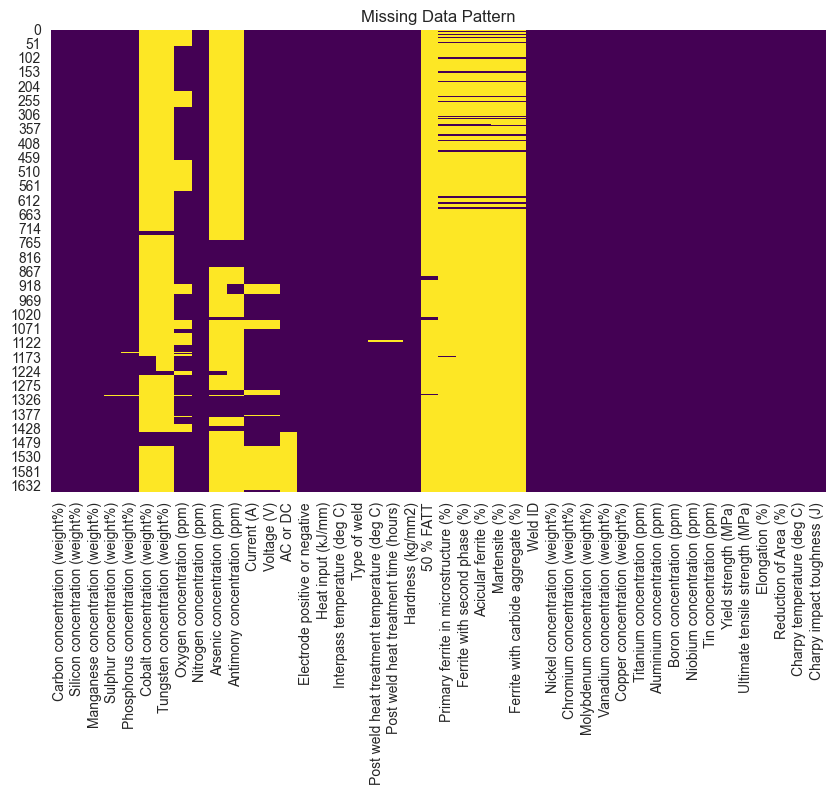

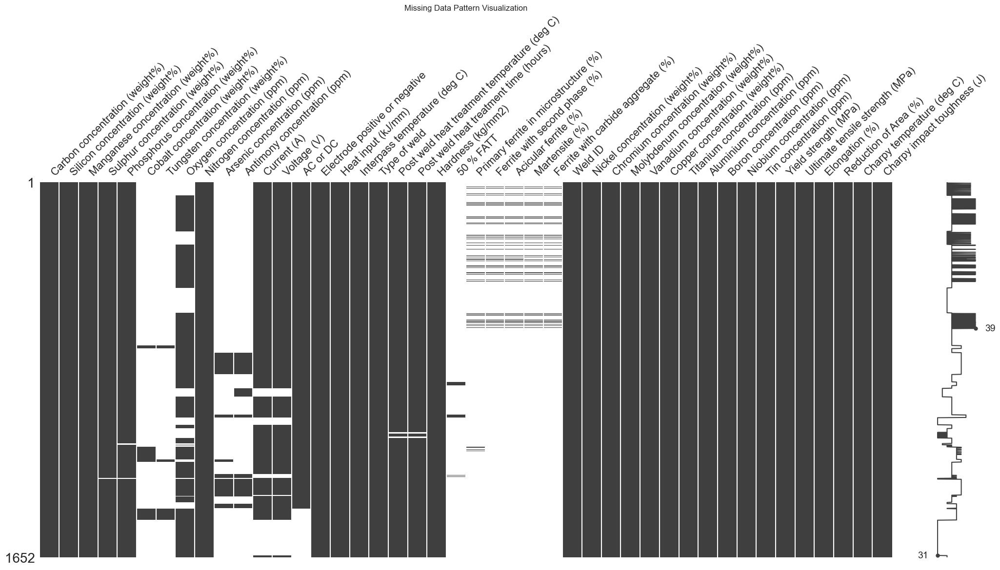

In [55]:
# Visualize missing data patterns
import seaborn as sns
import matplotlib.pyplot as plt

df = pd.read_csv("weld_data_imputed.csv")
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Data Pattern")
plt.show()


import missingno as msno
import matplotlib.pyplot as plt

# Visualize the missing data pattern
msno.matrix(df)
plt.title("Missing Data Pattern Visualization")
plt.show()



In [56]:
import pandas as pd
from sklearn.impute import SimpleImputer

# Chargement des données
df = pd.read_csv("weld_data_imputed.csv")

# Sélection des colonnes pour l'imputation
# (Tu peux modifier cette liste selon tes besoins)
columns_to_impute = [
    "Sulphur concentration (weight%)",
    "Phosphorus concentration (weight%)",
    "Oxygen concentration (ppm)",
    "Nitrogen concentration (ppm)",
    "Current (A)",
    "Voltage (V)",
    "Post weld heat treatment temperature (deg C)",
    "Post weld heat treatment time (hours)"
    # Ajoute d'autres colonnes que tu souhaites imputer
]

# Création d'un imputeur univarié utilisant la médiane
imputer = SimpleImputer(strategy='median')

# Application de l'imputation univariée sur les colonnes sélectionnées
imputed_data = imputer.fit_transform(df[columns_to_impute])

# Création d'une nouvelle DataFrame avec les données imputées
df_imputed = pd.DataFrame(imputed_data, columns=columns_to_impute)

# Ajouter les colonnes non imputées à la nouvelle DataFrame
df_imputed = pd.concat([df.drop(columns=columns_to_impute).reset_index(drop=True), df_imputed], axis=1)

# Afficher un aperçu de la DataFrame imputée
print("DataFrame après imputation univariée par la médiane :")
print(df_imputed.head())

# Optionnel : Enregistrer la DataFrame imputée dans un fichier CSV
df_imputed.to_csv("weld_data_imputed_median.csv", index=False)
print("Les données imputées par la médiane ont été écrites dans 'weld_data_imputed_median.csv' avec succès.")


DataFrame après imputation univariée par la médiane :
   Carbon concentration (weight%)  Silicon concentration (weight%)  \
0                           370.0                           3000.0   
1                           370.0                           3000.0   
2                           370.0                           3000.0   
3                           370.0                           3100.0   
4                           370.0                           3100.0   

   Manganese concentration (weight%)  Cobalt concentration (weight%)  \
0                             6500.0                             NaN   
1                             6500.0                             NaN   
2                             6500.0                             NaN   
3                            10300.0                             NaN   
4                            10300.0                             NaN   

   Tungsten concentration (weight%)  Arsenic concentration (ppm)  \
0                       

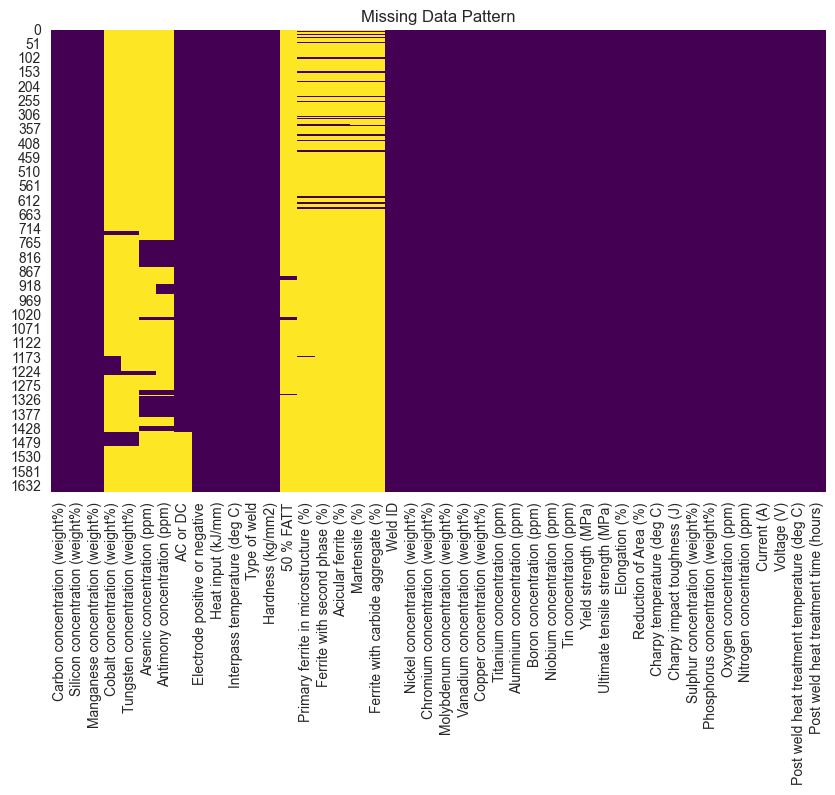

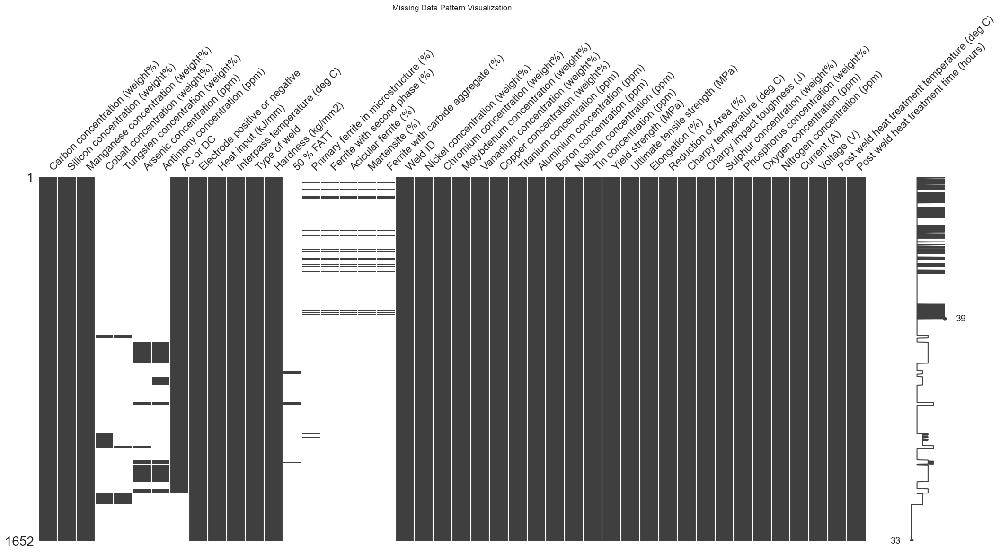

In [57]:
# Visualize missing data patterns
import seaborn as sns
import matplotlib.pyplot as plt

df = pd.read_csv("weld_data_imputed_median.csv")
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Data Pattern")
plt.show()


import missingno as msno
import matplotlib.pyplot as plt

# Visualize the missing data pattern
msno.matrix(df)
plt.title("Missing Data Pattern Visualization")
plt.show()



In [58]:
import pandas as pd
from sklearn.impute import SimpleImputer

# Chargement des données
df = pd.read_csv("weld_data_imputed_median.csv")

# Sélection des colonnes pour l'imputation
# (Assure-toi que ces colonnes contiennent des valeurs catégorielles ou numériques avec des répétitions)
columns_to_impute = [
    "Electrode positive or negative",  # Exemple de colonne à imputé par mode
    "AC or DC"                         # Exemple de colonne à imputé par mode
]

# Création d'un imputeur univarié utilisant le mode
imputer = SimpleImputer(strategy='most_frequent')

# Application de l'imputation univariée sur les colonnes sélectionnées
imputed_data = imputer.fit_transform(df[columns_to_impute])

# Création d'une nouvelle DataFrame avec les données imputées
df_imputed = pd.DataFrame(imputed_data, columns=columns_to_impute)

# Ajouter les colonnes non imputées à la nouvelle DataFrame
df_imputed = pd.concat([df.drop(columns=columns_to_impute).reset_index(drop=True), df_imputed], axis=1)

# Afficher un aperçu de la DataFrame imputée
print("DataFrame après imputation univariée par le mode :")
print(df_imputed.head())

# Optionnel : Enregistrer la DataFrame imputée dans un fichier CSV
df_imputed.to_csv("weld_data_imputed_mode.csv", index=False)
print("Les données imputées par le mode ont été écrites dans 'weld_data_imputed_mode.csv' avec succès.")


DataFrame après imputation univariée par le mode :
   Carbon concentration (weight%)  Silicon concentration (weight%)  \
0                           370.0                           3000.0   
1                           370.0                           3000.0   
2                           370.0                           3000.0   
3                           370.0                           3100.0   
4                           370.0                           3100.0   

   Manganese concentration (weight%)  Cobalt concentration (weight%)  \
0                             6500.0                             NaN   
1                             6500.0                             NaN   
2                             6500.0                             NaN   
3                            10300.0                             NaN   
4                            10300.0                             NaN   

   Tungsten concentration (weight%)  Arsenic concentration (ppm)  \
0                          

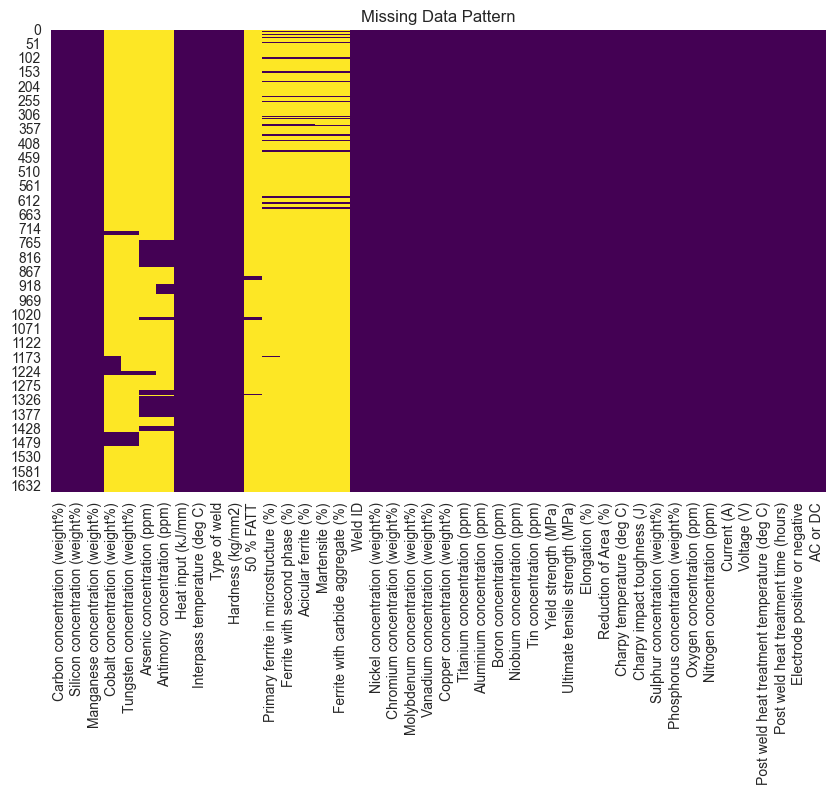

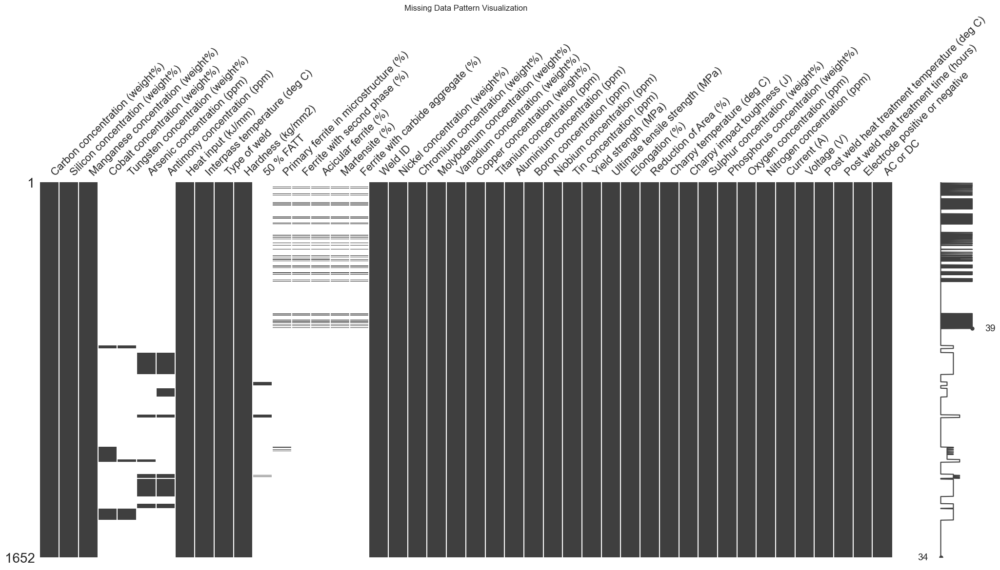

In [59]:
# Visualize missing data patterns
import seaborn as sns
import matplotlib.pyplot as plt

df = pd.read_csv("weld_data_imputed_mode.csv")
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Data Pattern")
plt.show()


import missingno as msno
import matplotlib.pyplot as plt

# Visualize the missing data pattern
msno.matrix(df)
plt.title("Missing Data Pattern Visualization")
plt.show()



In [60]:
import pandas as pd

# Chargement des données
df = pd.read_csv("weld_data_imputed_mode.csv")

# Définir une fonction de capping
def cap_values(df, column, lower_quantile=0.05, upper_quantile=0.95):
    """
    Applique la méthode de capping sur une colonne spécifiée d'un DataFrame.
    
    Args:
        df (pd.DataFrame): Le DataFrame sur lequel appliquer le capping.
        column (str): Le nom de la colonne à traiter.
        lower_quantile (float): Quantile inférieur pour le capping (par défaut 0.05).
        upper_quantile (float): Quantile supérieur pour le capping (par défaut 0.95).
        
    Returns:
        pd.Series: La colonne avec les valeurs caps.
    """
    lower_bound = df[column].quantile(lower_quantile)
    upper_bound = df[column].quantile(upper_quantile)
    
    # Appliquer le capping
    df[column] = df[column].clip(lower=lower_bound, upper=upper_bound)

# Liste des colonnes sur lesquelles appliquer le capping
columns_to_cap = [
    "Elongation (%)",
    "Reduction of Area (%)",
    "Ultimate tensile strength (MPa)",
    "Yield strength (MPa)",
    "Post weld heat treatment time (hours)",
    "Post weld heat treatment temperature (deg C)"
]

# Appliquer le capping sur chaque colonne spécifiée
for col in columns_to_cap:
    cap_values(df, col)

# Afficher les résultats après capping
print("DataFrame après application du capping :")
print(df.head())

# Enregistrer le DataFrame modifié dans un fichier CSV
df.to_csv("weld_data_capped.csv", index=False)


DataFrame après application du capping :
   Carbon concentration (weight%)  Silicon concentration (weight%)  \
0                           370.0                           3000.0   
1                           370.0                           3000.0   
2                           370.0                           3000.0   
3                           370.0                           3100.0   
4                           370.0                           3100.0   

   Manganese concentration (weight%)  Cobalt concentration (weight%)  \
0                             6500.0                             NaN   
1                             6500.0                             NaN   
2                             6500.0                             NaN   
3                            10300.0                             NaN   
4                            10300.0                             NaN   

   Tungsten concentration (weight%)  Arsenic concentration (ppm)  \
0                               NaN  

In [62]:
import pandas as pd

# Chargement des données
df = pd.read_csv("weld_data_capped.csv")

# Afficher les colonnes avant la suppression
print("Colonnes avant la suppression :")
print(df.columns)

# Définir les colonnes à supprimer
columns_to_drop = [
    "Ferrite with carbide aggregate (%)",  # Exemple de colonne à supprimer
    "Martensite (%)",
    "Acicular ferrite (%)",
    "Ferrite with second phase (%)",
    "Primary ferrite in microstructure (%)",
    "50 % FATT",
    "Hardness (kg/mm2)",
    "Antimony concentration (ppm)",
    "Arsenic concentration (ppm)",
    "Tin concentration (ppm)"# Exemple de colonne à supprimer
]

# Supprimer les colonnes
df_dropped = df.drop(columns=columns_to_drop)

# Afficher les colonnes après la suppression
print("\nColonnes après la suppression :")
print(df_dropped.columns)

# Optionnel : Enregistrer le DataFrame modifié dans un nouveau fichier CSV
df_dropped.to_csv("weld_data_dropped.csv", index=False)
print("\nLes données avec les colonnes supprimées ont été écrites dans 'weld_data_dropped.csv' avec succès.")


Colonnes avant la suppression :
Index(['Carbon concentration (weight%)', 'Silicon concentration (weight%)',
       'Manganese concentration (weight%)', 'Cobalt concentration (weight%)',
       'Tungsten concentration (weight%)', 'Arsenic concentration (ppm)',
       'Antimony concentration (ppm)', 'Heat input (kJ/mm)',
       'Interpass temperature (deg C)', 'Type of weld', 'Hardness (kg/mm2)',
       '50 % FATT', 'Primary ferrite in microstructure (%)',
       'Ferrite with second phase (%)', 'Acicular ferrite (%)',
       'Martensite (%)', 'Ferrite with carbide aggregate (%)', 'Weld ID',
       'Nickel concentration (weight%)', 'Chromium concentration (weight%)',
       'Molybdenum concentration (weight%)',
       'Vanadium concentration (weight%)', 'Copper concentration (weight%)',
       'Titanium concentration (ppm)', 'Aluminium concentration (ppm)',
       'Boron concentration (ppm)', 'Niobium concentration (ppm)',
       'Tin concentration (ppm)', 'Yield strength (MPa)',
       

DataFrame avec les composantes principales :
   Elongation (%) & Reduction of Area (%) PCA  \
0                                   -9.104216   
1                                   -4.305923   
2                                   -9.414399   
3                                   -8.794034   
4                                   -1.720498   

   Ultimate tensile strength (MPa) & Yield strength (MPa) PCA  \
0                                        -147.481942            
1                                        -137.141898            
2                                        -151.857253            
3                                        -127.579127            
4                                         -67.929286            

   Post weld heat treatment time (hours) & Post weld heat treatment temperature (deg C) PCA  
0                                         -53.829338                                         
1                                        -303.911147                             

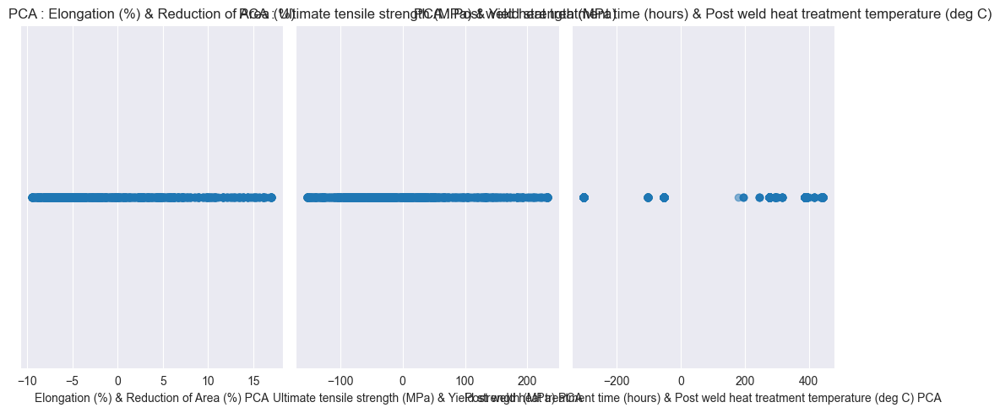

In [63]:
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Chargement des données
df = pd.read_csv("weld_data_dropped.csv")

# Définition des paires de colonnes pour la PCA
pairs_of_columns = [
    ("Elongation (%)", "Reduction of Area (%)"),  # PCA 1
    ("Ultimate tensile strength (MPa)", "Yield strength (MPa)"), # PCA 2
    ("Post weld heat treatment time (hours)", "Post weld heat treatment temperature (deg C)")  # PCA 3
]

# Initialisation d'une liste pour stocker les DataFrames de résultats
results = []

# Fonction pour appliquer la PCA sur une paire de colonnes
def apply_pca_on_columns(col1, col2, df):
    # Normalisation des données
    data_to_pca = df[[col1, col2]].dropna()  # Supprime les NaN si nécessaire

    # Appliquer le PCA
    pca = PCA(n_components=1)  # On choisit 1 composante pour fusionner en une seule dimension
    principal_components = pca.fit_transform(data_to_pca)

    # Créer un DataFrame avec la composante principale
    df_pca = pd.DataFrame(data=principal_components, columns=[f"{col1} & {col2} PCA"])
    return df_pca

# Appliquer la PCA sur chaque paire de colonnes
for col1, col2 in pairs_of_columns:
    df_pca = apply_pca_on_columns(col1, col2, df)
    results.append(df_pca)

# Combiner les résultats dans une nouvelle DataFrame
pca_results_df = pd.concat(results, axis=1)

# Afficher les résultats
print("DataFrame avec les composantes principales :")
print(pca_results_df.head())

# Optionnel : Tracer les composantes principales
plt.figure(figsize=(10, 5))
for i, (col1, col2) in enumerate(pairs_of_columns):
    plt.subplot(1, len(pairs_of_columns), i + 1)
    plt.scatter(pca_results_df.iloc[:, i], [0] * len(pca_results_df), alpha=0.5)
    plt.title(f"PCA : {col1} & {col2}")
    plt.xlabel(f"{col1} & {col2} PCA")
    plt.yticks([])  # Supprimer l'axe des ordonnées

plt.tight_layout()
plt.show()

# Enregistrer la nouvelle DataFrame dans un fichier CSV si nécessaire
pca_results_df.to_csv("pca_results.csv", index=False)


DataFrame avec les colonnes originales supprimées et les composantes principales ajoutées :
   Carbon concentration (weight%)  Silicon concentration (weight%)  \
0                           370.0                           3000.0   
1                           370.0                           3000.0   
2                           370.0                           3000.0   
3                           370.0                           3100.0   
4                           370.0                           3100.0   

   Manganese concentration (weight%)  Cobalt concentration (weight%)  \
0                             6500.0                             NaN   
1                             6500.0                             NaN   
2                             6500.0                             NaN   
3                            10300.0                             NaN   
4                            10300.0                             NaN   

   Tungsten concentration (weight%)  Heat input (kJ/mm

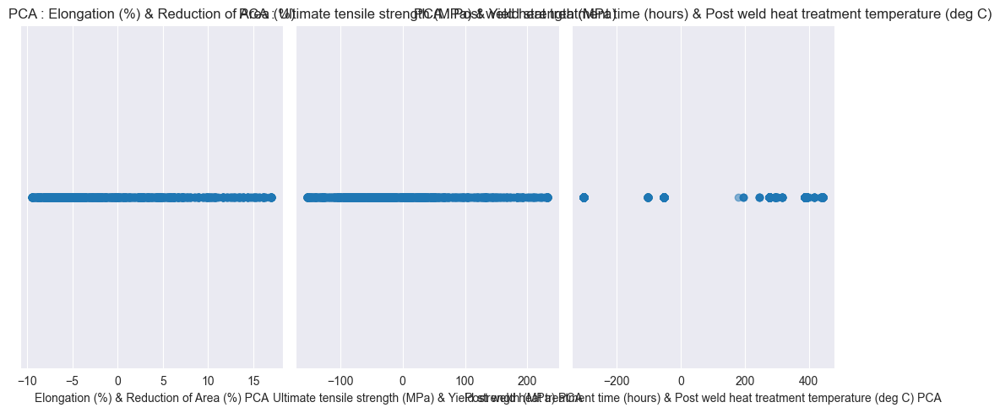

In [64]:
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Chargement des données
df = pd.read_csv("weld_data_dropped.csv")

# Définition des paires de colonnes pour la PCA
pairs_of_columns = [
    ("Elongation (%)", "Reduction of Area (%)"),  # PCA 1
    ("Ultimate tensile strength (MPa)", "Yield strength (MPa)"),  # PCA 2
    ("Post weld heat treatment time (hours)", "Post weld heat treatment temperature (deg C)")  # PCA 3
]

# Initialisation d'une liste pour stocker les colonnes PCA
pca_columns = []

# Fonction pour appliquer la PCA sur une paire de colonnes
def apply_pca_on_columns(col1, col2, df):
    # Normalisation des données
    data_to_pca = df[[col1, col2]].dropna()  # Supprime les NaN si nécessaire

    # Appliquer le PCA
    pca = PCA(n_components=1)  # On choisit 1 composante pour fusionner en une seule dimension
    principal_components = pca.fit_transform(data_to_pca)

    # Créer un DataFrame avec la composante principale
    df_pca = pd.DataFrame(data=principal_components, columns=[f"{col1} & {col2} PCA"])

    # Remplir avec NaN là où des données manquaient initialement
    pca_full_column = pd.Series(index=df.index, dtype='float64')
    pca_full_column.loc[data_to_pca.index] = df_pca.values.flatten()

    return pca_full_column

# Appliquer la PCA sur chaque paire de colonnes, ajouter la nouvelle colonne PCA, puis supprimer les anciennes
for col1, col2 in pairs_of_columns:
    # Appliquer PCA sur la paire de colonnes
    pca_column = apply_pca_on_columns(col1, col2, df)

    # Ajouter la colonne PCA au DataFrame
    df[f"{col1} & {col2} PCA"] = pca_column

    # Supprimer les colonnes originales utilisées dans la PCA
    df.drop([col1, col2], axis=1, inplace=True)

# Afficher les résultats
print("DataFrame avec les colonnes originales supprimées et les composantes principales ajoutées :")
print(df.head())

# Optionnel : Tracer les composantes principales
plt.figure(figsize=(10, 5))
for i, (col1, col2) in enumerate(pairs_of_columns):
    plt.subplot(1, len(pairs_of_columns), i + 1)
    plt.scatter(df[f"{col1} & {col2} PCA"], [0] * len(df), alpha=0.5)
    plt.title(f"PCA : {col1} & {col2}")
    plt.xlabel(f"{col1} & {col2} PCA")
    plt.yticks([])  # Supprimer l'axe des ordonnées

plt.tight_layout()
plt.show()

# Enregistrer la nouvelle DataFrame dans un fichier CSV si nécessaire
df.to_csv("pca_results_without_original_columns.csv", index=False)


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


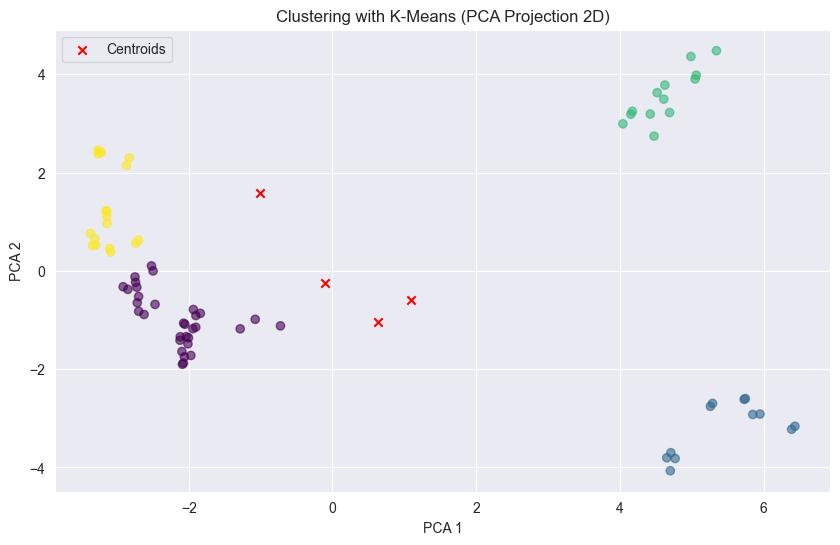

In [70]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# Chargement des données
df = pd.read_csv("pca_results_without_original_columns.csv")

# Sélectionner les colonnes sur lesquelles on va appliquer le clustering
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
data_for_clustering = df[numeric_columns].dropna()

# Normalisation des données
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data_for_clustering)

# Appliquer le clustering K-Means
kmeans = KMeans(n_clusters=4, random_state=42)
clusters = kmeans.fit_predict(scaled_data)

# Ajouter les labels des clusters au DataFrame
df['Cluster'] = pd.Series(clusters, index=data_for_clustering.index)

# Visualisation avec PCA (2D)
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)

plt.figure(figsize=(10, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=clusters, cmap='viridis', alpha=0.6)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], c='red', marker='x', label='Centroids')
plt.title('Clustering with K-Means (PCA Projection 2D)')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.legend()
plt.show()

# Enregistrer les résultats dans un fichier CSV si nécessaire
df.to_csv("clustering_results.csv", index=False)


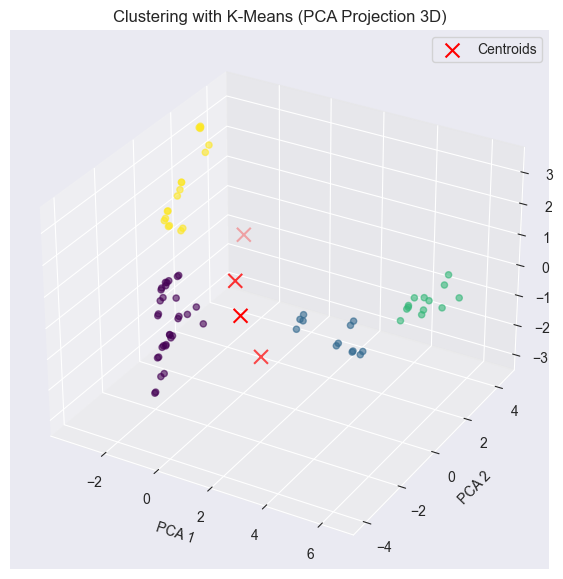

In [71]:
from mpl_toolkits.mplot3d import Axes3D

# PCA pour 3D
pca_3d = PCA(n_components=3)
pca_result_3d = pca_3d.fit_transform(scaled_data)

# Visualisation en 3D
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot des données en 3D
ax.scatter(pca_result_3d[:, 0], pca_result_3d[:, 1], pca_result_3d[:, 2], c=clusters, cmap='viridis', marker='o', alpha=0.6)

# Visualiser les centroïdes en 3D
ax.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], kmeans.cluster_centers_[:, 2], c='red', marker='x', s=100, label='Centroids')

ax.set_title('Clustering with K-Means (PCA Projection 3D)')
ax.set_xlabel('PCA 1')
ax.set_ylabel('PCA 2')
ax.set_zlabel('PCA 3')
plt.legend()
plt.show()
